# PFA FOR MICRO CREDIT DEFAULTER PROJECT

IMPORTING LIBRARIES

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
import pickle
from sklearn.datasets import make_classification
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import f1_score
from sklearn.metrics import auc
from matplotlib import pyplot

import warnings
warnings.filterwarnings('ignore')

WORKING WITH DATASETS

In [2]:
df=pd.read_csv(r'C:/Users/user/Desktop/FRTech Internship Project/Micro Credit Project/Data file.csv')
df.head()

,Unnamed: 0,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,...,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pcircle,pdate
0,1,0,21408I70789,272.0,3055.050000,3065.150000,220.13,260.13,2.0,0.0,...,6.0,0.0,2.0,12,6,0.0,29.000000,29.000000,UPW,2016-07-20
1,2,1,76462I70374,712.0,12122.000000,12124.750000,3691.26,3691.26,20.0,0.0,...,12.0,0.0,1.0,12,12,0.0,0.000000,0.000000,UPW,2016-08-10
2,3,1,17943I70372,535.0,1398.000000,1398.000000,900.13,900.13,3.0,0.0,...,6.0,0.0,1.0,6,6,0.0,0.000000,0.000000,UPW,2016-08-19
3,4,1,55773I70781,241.0,21.228000,21.228000,159.42,159.42,41.0,0.0,...,6.0,0.0,2.0,12,6,0.0,0.000000,0.000000,UPW,2016-06-06
4,5,1,03813I82730,947.0,150.619333,150.619333,1098.90,1098.90,4.0,0.0,...,6.0,0.0,7.0,42,6,0.0,2.333333,2.333333,UPW,2016-06-22


USEFUL INFORMATION

In [3]:
# dropping column
frame=df.drop(['Unnamed: 0','msisdn','aon','daily_decr30','daily_decr90'], axis=1, inplace=True)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209593 entries, 0 to 209592
Data columns (total 32 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   label                 209593 non-null  int64  
 1   rental30              209593 non-null  float64
 2   rental90              209593 non-null  float64
 3   last_rech_date_ma     209593 non-null  float64
 4   last_rech_date_da     209593 non-null  float64
 5   last_rech_amt_ma      209593 non-null  int64  
 6   cnt_ma_rech30         209593 non-null  int64  
 7   fr_ma_rech30          209593 non-null  float64
 8   sumamnt_ma_rech30     209593 non-null  float64
 9   medianamnt_ma_rech30  209593 non-null  float64
 10  medianmarechprebal30  209593 non-null  float64
 11  cnt_ma_rech90         209593 non-null  int64  
 12  fr_ma_rech90          209593 non-null  int64  
 13  sumamnt_ma_rech90     209593 non-null  int64  
 14  medianamnt_ma_rech90  209593 non-null  float64
 15  

In [5]:
df.describe(include='all')

,label,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,...,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pcircle,pdate
count,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,...,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593,209593
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,82
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,UPW,2016-07-04
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,209593,3150
mean,0.875177,2692.581910,3483.406534,3755.847800,3712.202921,2064.452797,3.978057,3737.355121,7704.501157,1812.817952,...,274.658747,0.054029,18.520919,23.645398,6.703134,0.046077,3.398826,4.321485,NaN,NaN
std,0.330519,4308.586781,5770.461279,53905.892230,53374.833430,2370.786034,4.256090,53643.625172,10139.621714,2070.864620,...,4245.264648,0.218039,224.797423,26.469861,2.103864,0.200692,8.813729,10.308108,NaN,NaN
min,0.000000,-23737.140000,-24720.580000,-29.000000,-29.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN
25%,1.000000,280.420000,300.260000,1.000000,0.000000,770.000000,1.000000,0.000000,1540.000000,770.000000,...,6.000000,0.000000,1.000000,6.000000,6.000000,0.000000,0.000000,0.000000,NaN,NaN
50%,1.000000,1083.570000,1334.000000,3.000000,0.000000,1539.000000,3.000000,2.000000,4628.000000,1539.000000,...,6.000000,0.000000,2.000000,12.000000,6.000000,0.000000,0.000000,1.666667,NaN,NaN
75%,1.000000,3356.940000,4201.790000,7.000000,0.000000,2309.000000,5.000000,6.000000,10010.000000,1924.000000,...,6.000000,0.000000,5.000000,30.000000,6.000000,0.000000,3.750000,4.500000,NaN,NaN


In [6]:
df.dtypes

label                     int64
rental30                float64
rental90                float64
last_rech_date_ma       float64
last_rech_date_da       float64
last_rech_amt_ma          int64
cnt_ma_rech30             int64
fr_ma_rech30            float64
sumamnt_ma_rech30       float64
medianamnt_ma_rech30    float64
medianmarechprebal30    float64
cnt_ma_rech90             int64
fr_ma_rech90              int64
sumamnt_ma_rech90         int64
medianamnt_ma_rech90    float64
medianmarechprebal90    float64
cnt_da_rech30           float64
fr_da_rech30            float64
cnt_da_rech90             int64
fr_da_rech90              int64
cnt_loans30               int64
amnt_loans30              int64
maxamnt_loans30         float64
medianamnt_loans30      float64
cnt_loans90             float64
amnt_loans90              int64
maxamnt_loans90           int64
medianamnt_loans90      float64
payback30               float64
payback90               float64
pcircle                  object
pdate   

In [7]:
df.isnull().sum()

label                   0
rental30                0
rental90                0
last_rech_date_ma       0
last_rech_date_da       0
last_rech_amt_ma        0
cnt_ma_rech30           0
fr_ma_rech30            0
sumamnt_ma_rech30       0
medianamnt_ma_rech30    0
medianmarechprebal30    0
cnt_ma_rech90           0
fr_ma_rech90            0
sumamnt_ma_rech90       0
medianamnt_ma_rech90    0
medianmarechprebal90    0
cnt_da_rech30           0
fr_da_rech30            0
cnt_da_rech90           0
fr_da_rech90            0
cnt_loans30             0
amnt_loans30            0
maxamnt_loans30         0
medianamnt_loans30      0
cnt_loans90             0
amnt_loans90            0
maxamnt_loans90         0
medianamnt_loans90      0
payback30               0
payback90               0
pcircle                 0
pdate                   0
dtype: int64

In [8]:
type(df)

pandas.core.frame.DataFrame

In [9]:
corr=df.corr()
corr

,label,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,...,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90
label,1.000000,0.058085,0.075521,0.003728,0.001711,0.131804,0.237331,0.001330,0.202828,0.141490,...,0.196283,0.197272,0.000248,0.044589,0.004733,0.199788,0.084144,0.035747,0.048336,0.049183
rental30,0.058085,1.000000,0.955237,-0.001095,0.003261,0.127271,0.233343,-0.001219,0.272649,0.129853,...,0.180203,0.233453,-0.000864,-0.016482,0.004012,0.298943,0.234211,-0.035489,0.072974,0.095147
rental90,0.075521,0.955237,1.000000,-0.001688,0.002794,0.121416,0.230260,-0.000503,0.259709,0.120242,...,0.171595,0.231906,-0.001411,-0.009467,0.005141,0.327436,0.251029,-0.034122,0.067110,0.099501
last_rech_date_ma,0.003728,-0.001095,-0.001688,1.000000,0.001790,-0.000147,0.004311,-0.001629,0.002105,-0.001358,...,0.001193,0.000903,0.000928,0.001835,-0.000225,0.000870,-0.001123,0.002771,-0.002233,-0.001583
last_rech_date_da,0.001711,0.003261,0.002794,0.001790,1.000000,-0.000149,0.001549,0.001158,0.000046,0.001037,...,0.000380,0.000536,0.000503,0.000061,-0.000972,0.000519,0.001524,-0.002239,0.000077,0.000417
last_rech_amt_ma,0.131804,0.127271,0.121416,-0.000147,-0.000149,1.000000,-0.002662,0.002876,0.440821,0.794646,...,-0.027612,0.008502,0.001000,0.028370,0.000093,0.014067,0.148460,0.021004,-0.027369,-0.014260
cnt_ma_rech30,0.237331,0.233343,0.230260,0.004311,0.001549,-0.002662,1.000000,0.001669,0.656986,-0.011792,...,0.765802,0.752296,0.000109,-0.067011,0.014703,0.685257,0.174104,-0.071451,0.043617,0.017362
fr_ma_rech30,0.001330,-0.001219,-0.000503,-0.001629,0.001158,0.002876,0.001669,1.000000,0.000714,-0.000579,...,0.002666,0.002470,-0.001100,-0.000331,0.003368,0.002634,-0.001890,-0.001292,0.001455,0.000998
sumamnt_ma_rech30,0.202828,0.272649,0.259709,0.002105,0.000046,0.440821,0.656986,0.000714,1.000000,0.489200,...,0.491864,0.531079,0.001633,-0.034460,0.009419,0.484761,0.257705,-0.042244,0.000112,-0.012596
medianamnt_ma_rech30,0.141490,0.129853,0.120242,-0.001358,0.001037,0.794646,-0.011792,-0.000579,0.489200,1.000000,...,-0.029789,0.007125,0.001985,0.032477,-0.001143,0.014546,0.159613,0.022692,-0.018398,-0.002861


In [10]:
corr.shape

(30, 30)

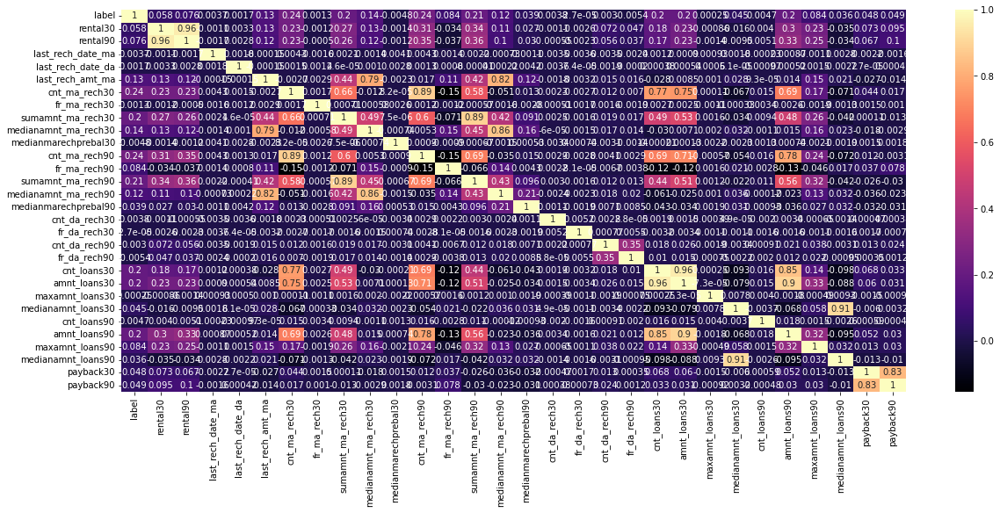

In [11]:
plt.figure(figsize=(20,8))
sns.heatmap(corr,annot=True,cmap='magma')
plt.show()

DATA VISUALIZATION

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209593 entries, 0 to 209592
Data columns (total 32 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   label                 209593 non-null  int64  
 1   rental30              209593 non-null  float64
 2   rental90              209593 non-null  float64
 3   last_rech_date_ma     209593 non-null  float64
 4   last_rech_date_da     209593 non-null  float64
 5   last_rech_amt_ma      209593 non-null  int64  
 6   cnt_ma_rech30         209593 non-null  int64  
 7   fr_ma_rech30          209593 non-null  float64
 8   sumamnt_ma_rech30     209593 non-null  float64
 9   medianamnt_ma_rech30  209593 non-null  float64
 10  medianmarechprebal30  209593 non-null  float64
 11  cnt_ma_rech90         209593 non-null  int64  
 12  fr_ma_rech90          209593 non-null  int64  
 13  sumamnt_ma_rech90     209593 non-null  int64  
 14  medianamnt_ma_rech90  209593 non-null  float64
 15  

In [13]:
df.shape

(209593, 32)

DATA VISUALIZATION

<AxesSubplot:title={'center':'Flag indicating the user paid back the credit amount within 5days of issuing the loan{1:success, 0:failure}'}>

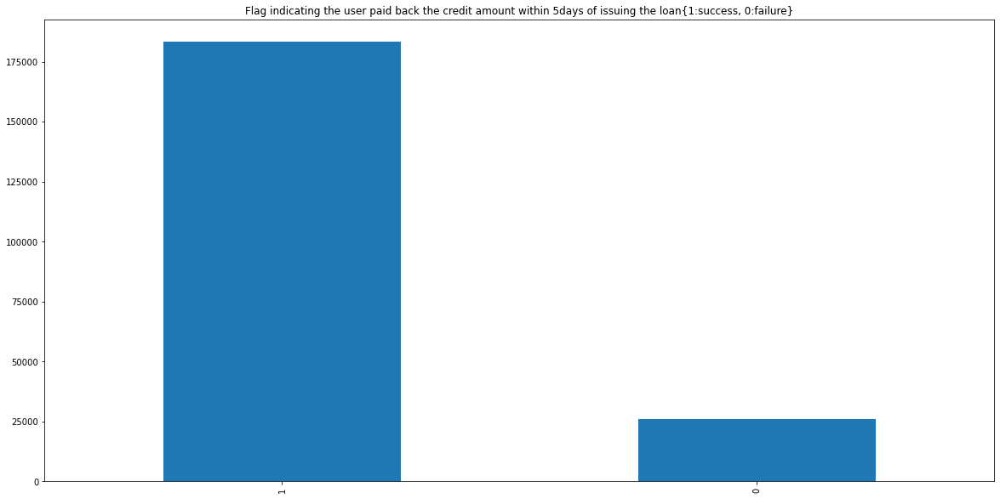

In [14]:
plt.subplot()
df['label'].value_counts().plot(kind='bar',title='Flag indicating the user paid back the credit amount within 5days of issuing the loan{1:success, 0:failure}',figsize=(20,10))

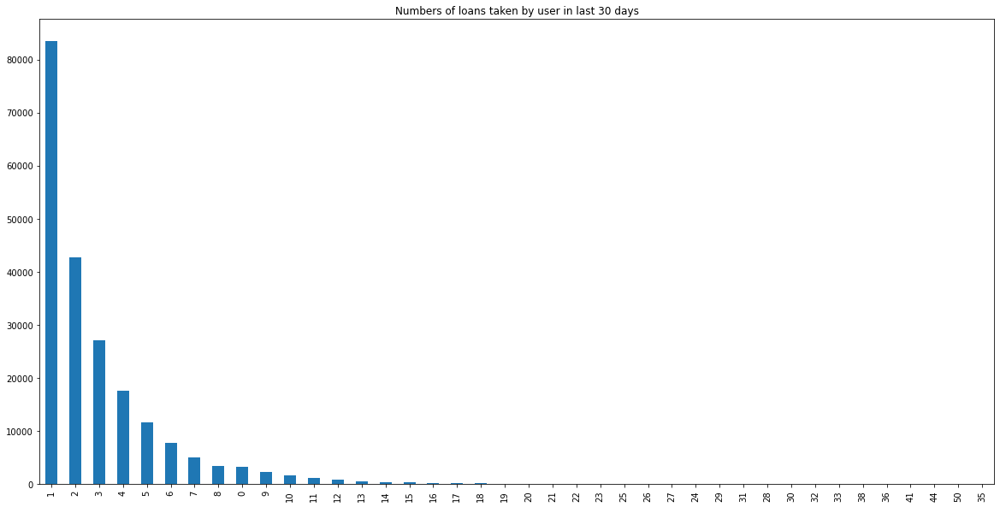

In [15]:
plt.subplot()
df['cnt_loans30'].value_counts().plot(kind='bar',title='Numbers of loans taken by user in last 30 days',figsize=(20,10));

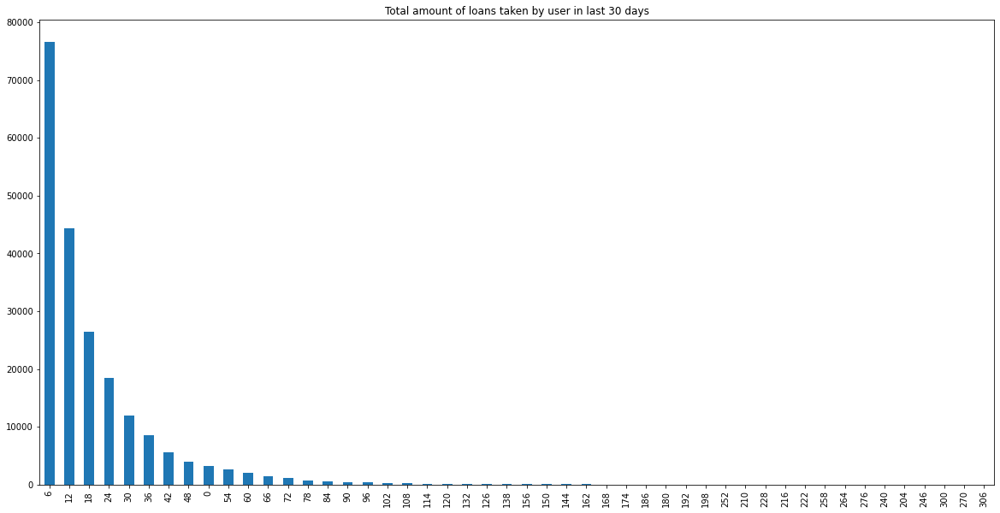

In [16]:
plt.subplot()
df['amnt_loans30'].value_counts().plot(kind='bar',title='Total amount of loans taken by user in last 30 days',figsize=(20,10));

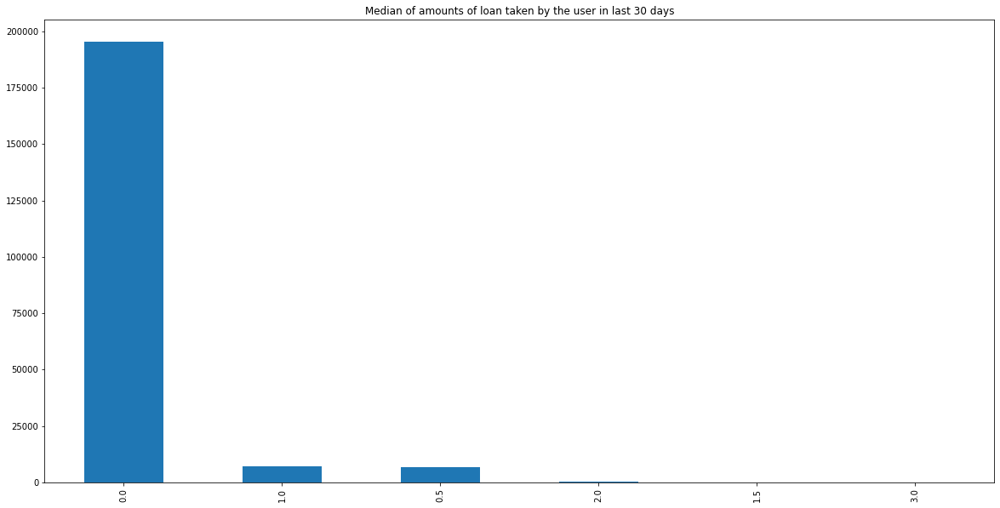

In [17]:
plt.subplot()
df['medianamnt_loans30'].value_counts().plot(kind='bar',title='Median of amounts of loan taken by the user in last 30 days',figsize=(20,10));

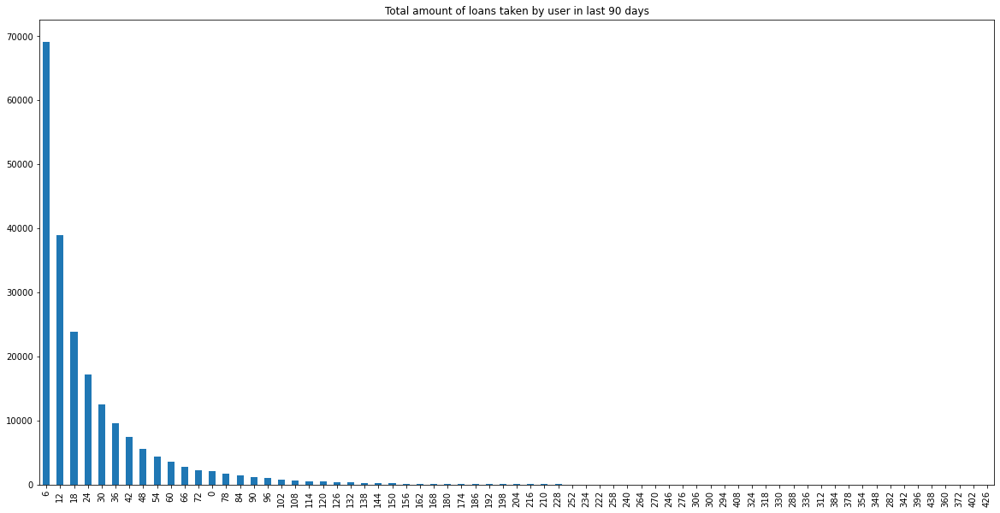

In [18]:
plt.subplot()
df['amnt_loans90'].value_counts().plot(kind='bar',title='Total amount of loans taken by user in last 90 days',figsize=(20,10));

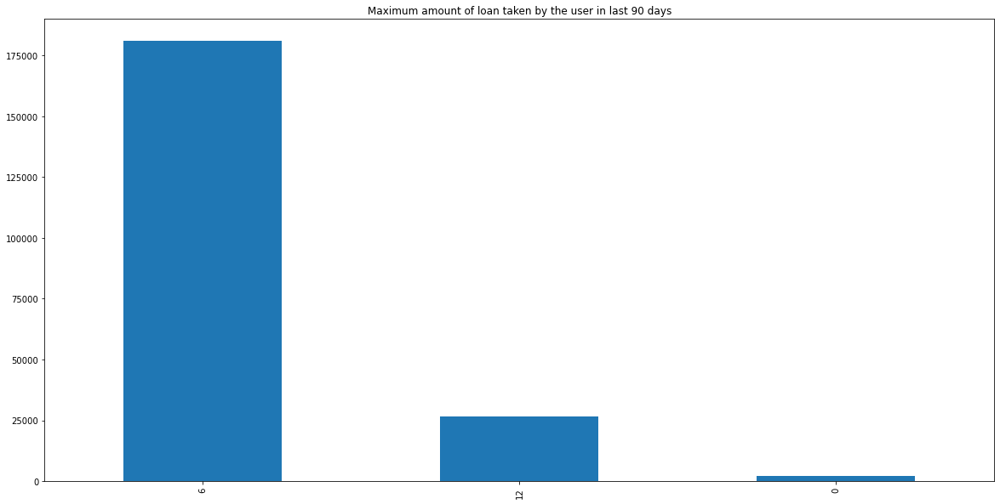

In [19]:
plt.subplot()
df['maxamnt_loans90'].value_counts().plot(kind='bar',title='Maximum amount of loan taken by the user in last 90 days',figsize=(20,10));

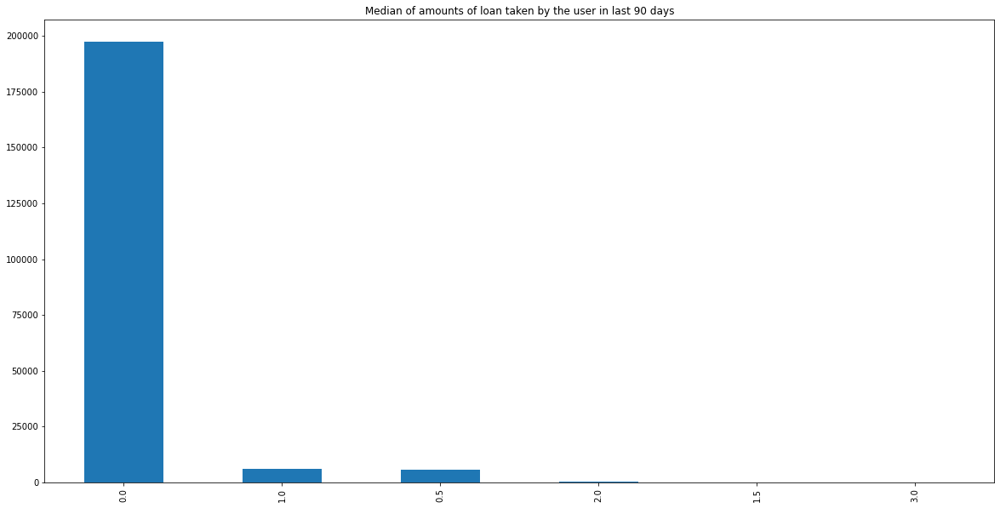

In [20]:
plt.subplot()
df['medianamnt_loans90'].value_counts().plot(kind='bar',title='Median of amounts of loan taken by the user in last 90 days',figsize=(20,10));

<AxesSubplot:title={'center':'telecom circle'}>

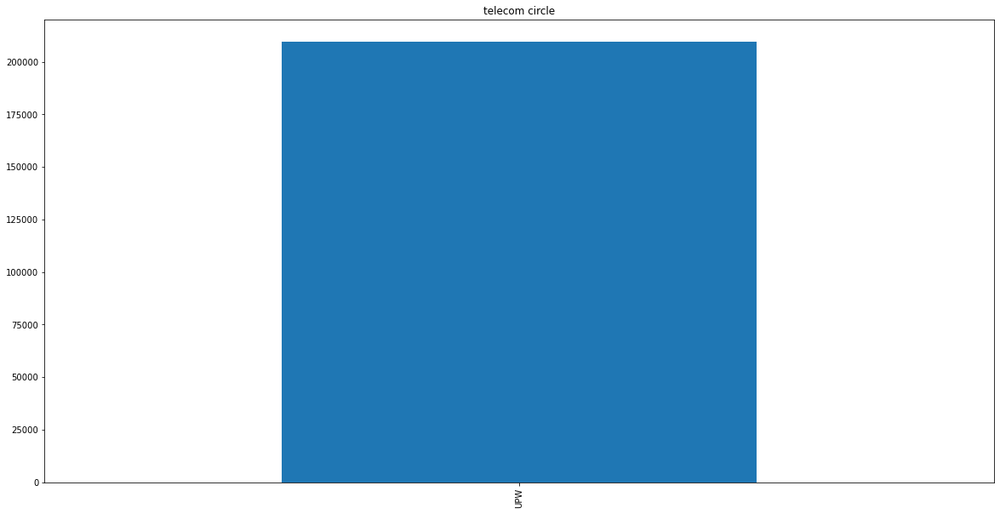

In [21]:
plt.subplot()
df['pcircle'].value_counts().plot(kind='bar',title='telecom circle',figsize=(20,10))

<AxesSubplot:title={'center':'date'}>

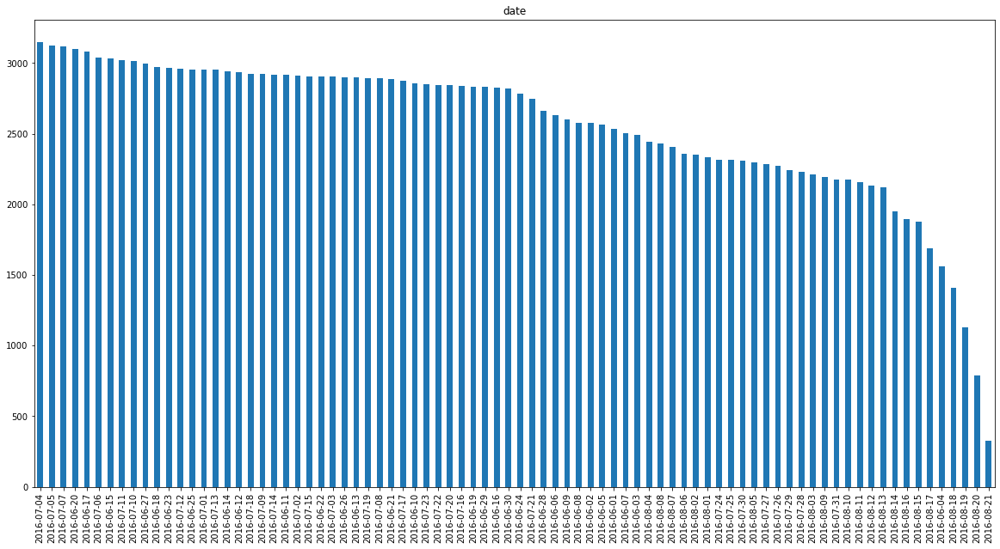

In [22]:
plt.subplot()
df['pdate'].value_counts().plot(kind='bar',title='date',figsize=(20,10))

DISTRIBUTION PLOT

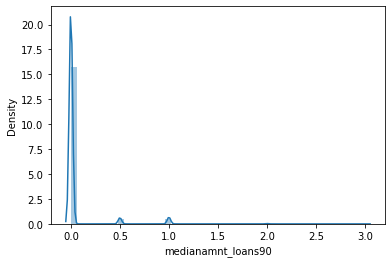

In [23]:
sns.distplot(df['medianamnt_loans90']);

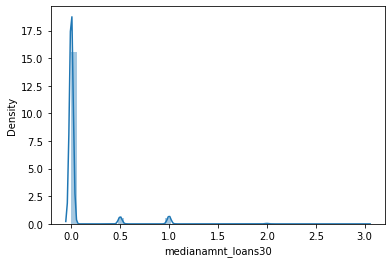

In [24]:
sns.distplot(df['medianamnt_loans30']);

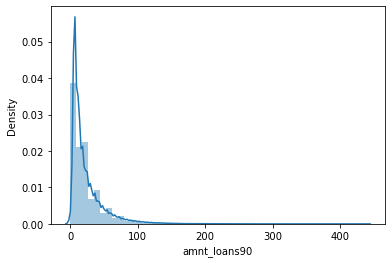

In [25]:
sns.distplot(df['amnt_loans90']);

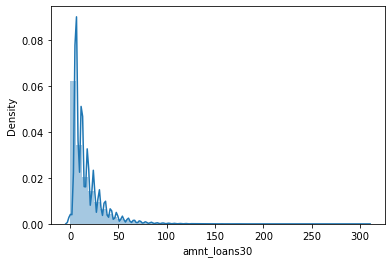

In [26]:
sns.distplot(df['amnt_loans30']);

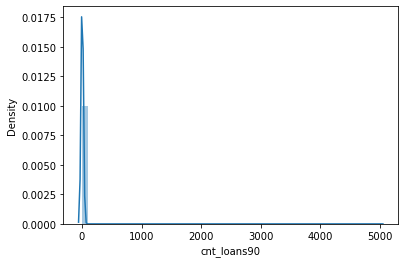

In [27]:
sns.distplot(df['cnt_loans90']);

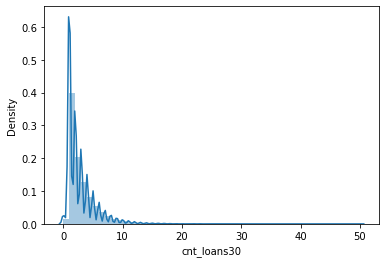

In [28]:
sns.distplot(df['cnt_loans30']);

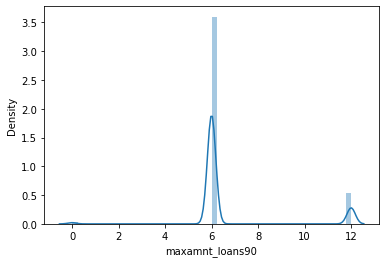

In [29]:
sns.distplot(df['maxamnt_loans90']);

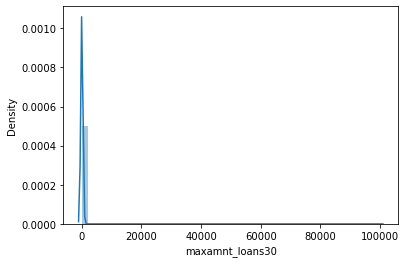

In [30]:
sns.distplot(df['maxamnt_loans30']);

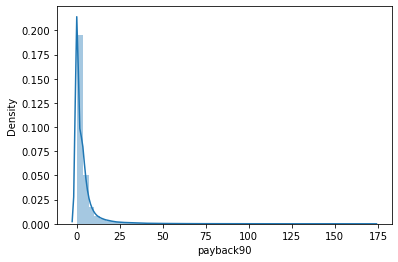

In [31]:
sns.distplot(df['payback90']);

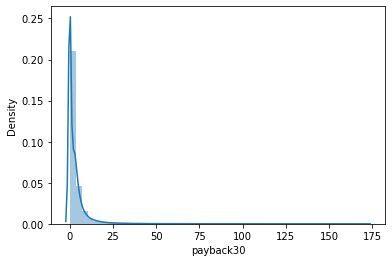

In [32]:
sns.distplot(df['payback30']);

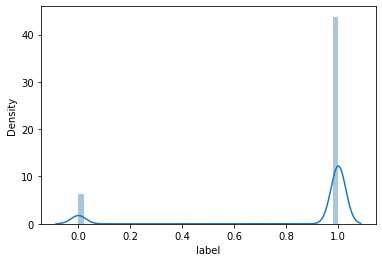

In [33]:
sns.distplot(df['label']);

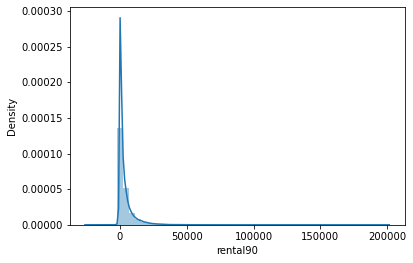

In [34]:
sns.distplot(df['rental90']);

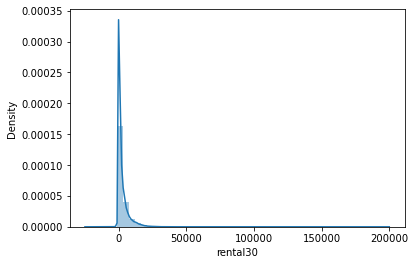

In [35]:
sns.distplot(df['rental30']);

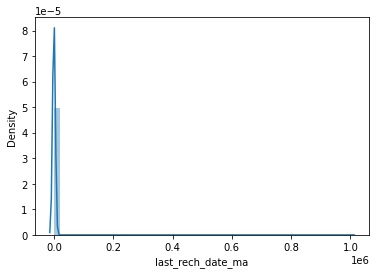

In [36]:
sns.distplot(df['last_rech_date_ma']);

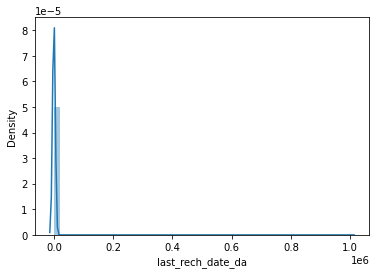

In [37]:
sns.distplot(df['last_rech_date_da']);

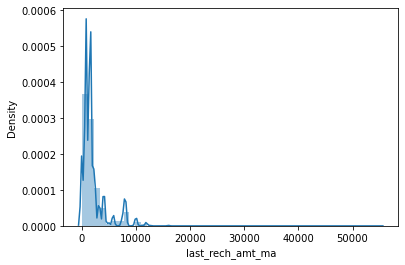

In [38]:
sns.distplot(df['last_rech_amt_ma']);

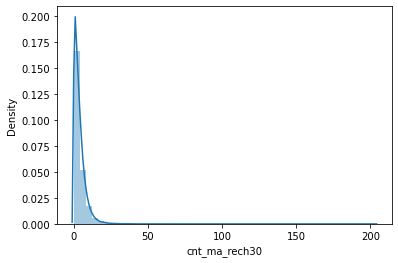

In [39]:
sns.distplot(df['cnt_ma_rech30']);

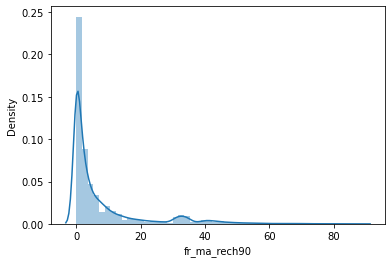

In [40]:
sns.distplot(df['fr_ma_rech90']);

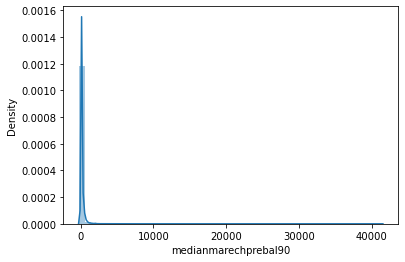

In [41]:
sns.distplot(df['medianmarechprebal90']);

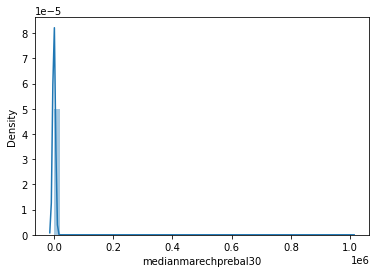

In [42]:
sns.distplot(df['medianmarechprebal30']);

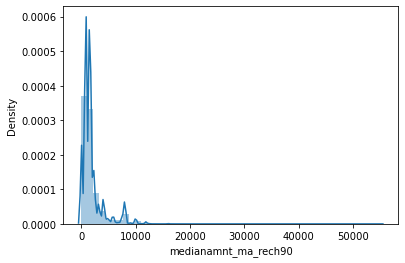

In [43]:
sns.distplot(df['medianamnt_ma_rech90']);

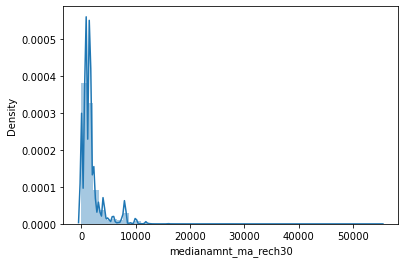

In [44]:
sns.distplot(df['medianamnt_ma_rech30']);

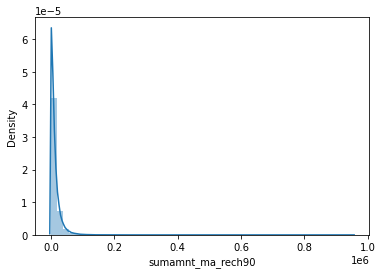

In [45]:
sns.distplot(df['sumamnt_ma_rech90']);

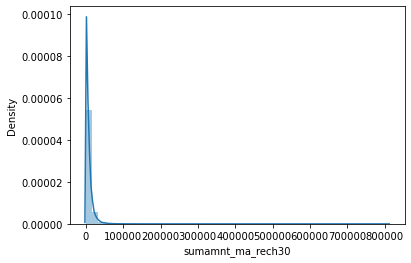

In [46]:
sns.distplot(df['sumamnt_ma_rech30']);

BOXPLOT WITH OUTLIERS

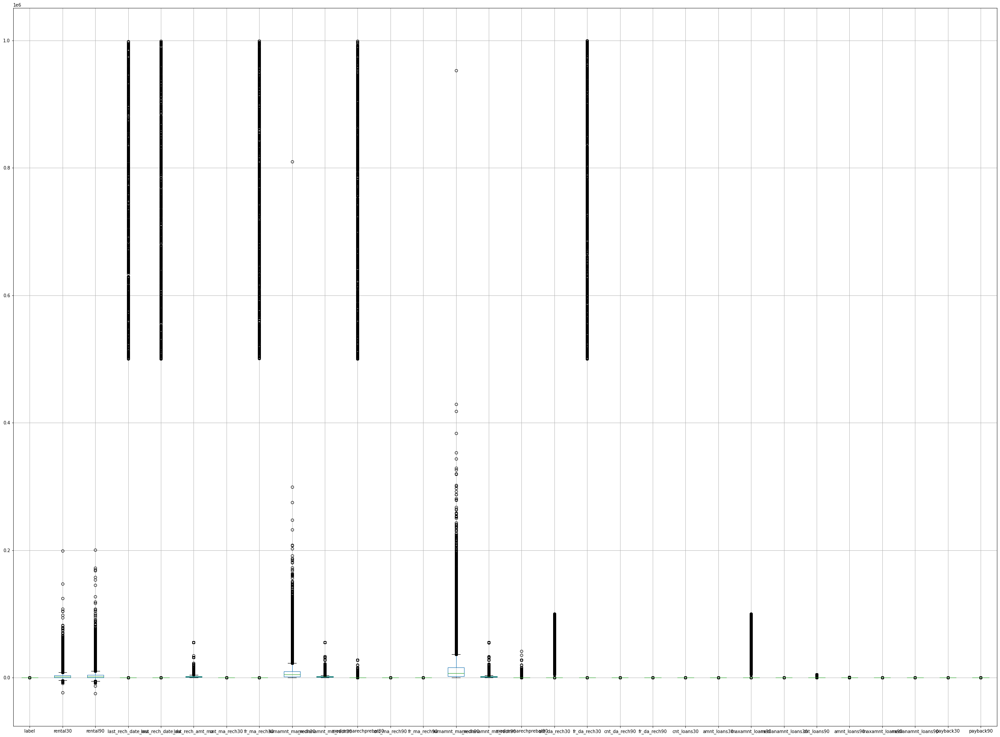

In [47]:
plt.figure(figsize=(40,30))
df.boxplot();

<AxesSubplot:>

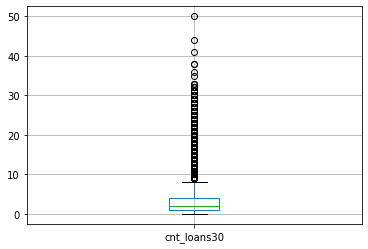

In [48]:
df.boxplot('cnt_loans30')

<AxesSubplot:>

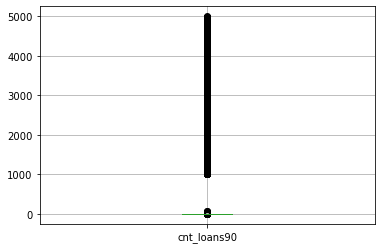

In [49]:
df.boxplot('cnt_loans90')

<AxesSubplot:>

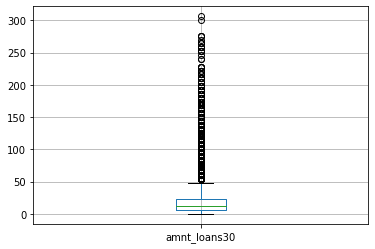

In [50]:
df.boxplot('amnt_loans30')

<AxesSubplot:>

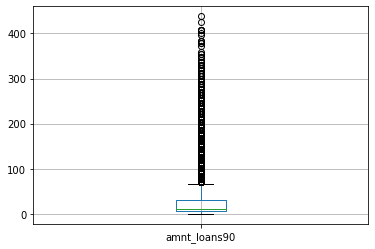

In [51]:
df.boxplot('amnt_loans90')

these are the outliers which have to be removed

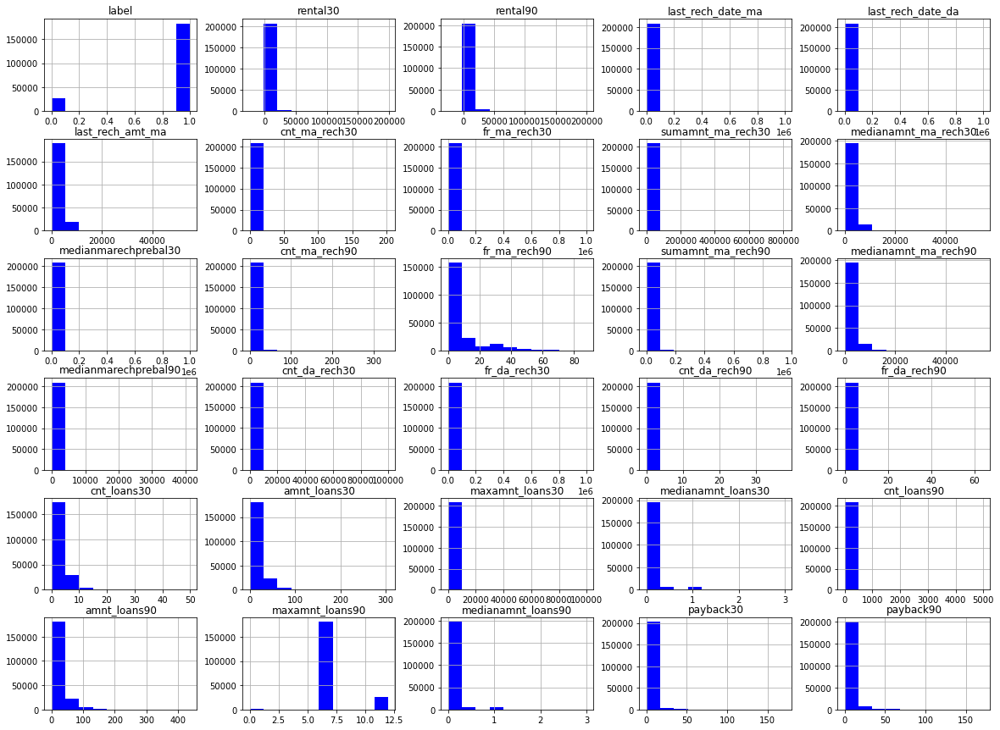

In [52]:
df.hist(color='b',figsize=(20,15))
plt.show()

SCATTER PLOT

                label  cnt_loans30
label        1.000000     0.196283
cnt_loans30  0.196283     1.000000


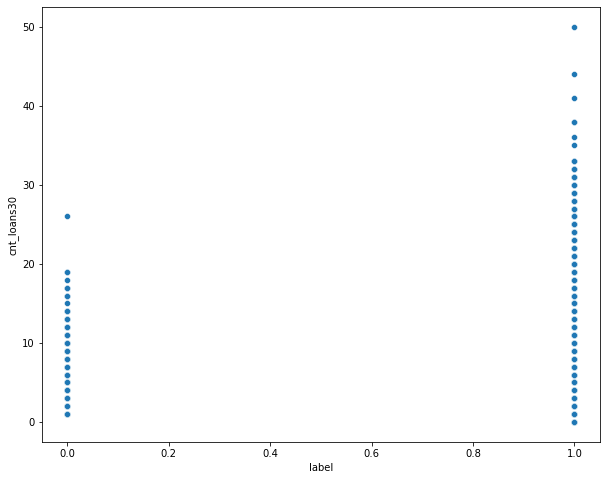

In [53]:
plt.figure(figsize=(10,8))
sns.scatterplot(df['label'],df['cnt_loans30'])
print(df[['label' , 'cnt_loans30']].corr())
plt.show()

                label  cnt_loans90
label        1.000000     0.004733
cnt_loans90  0.004733     1.000000


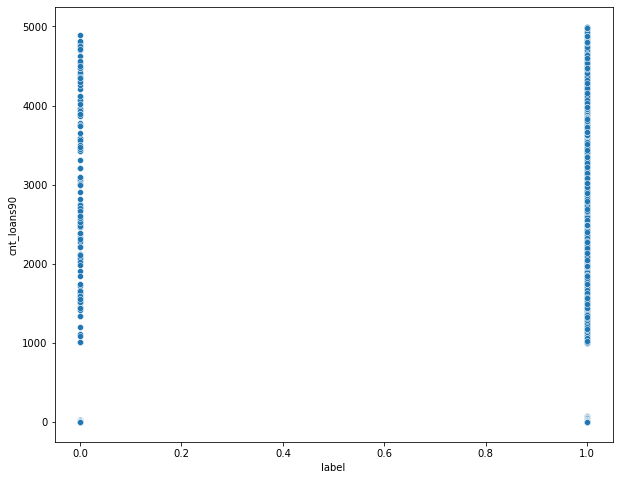

In [54]:
plt.figure(figsize=(10,8))
sns.scatterplot(df['label'],df['cnt_loans90'])
print(df[['label' , 'cnt_loans90']].corr())
plt.show()

                 label  amnt_loans30
label         1.000000      0.197272
amnt_loans30  0.197272      1.000000


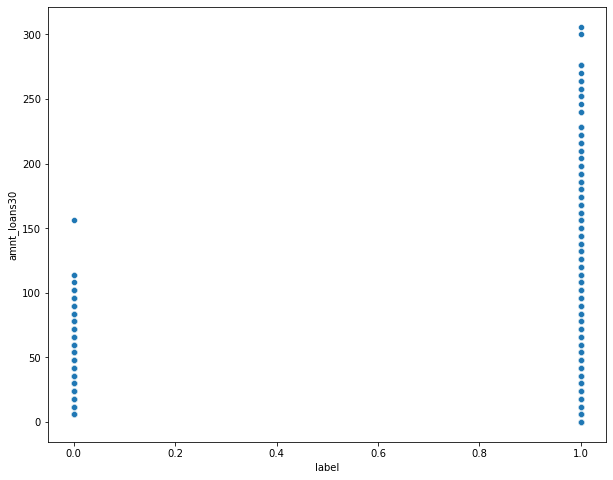

In [55]:
plt.figure(figsize=(10,8))
sns.scatterplot(df['label'],df['amnt_loans30'])
print(df[['label' , 'amnt_loans30']].corr())
plt.show()

                 label  amnt_loans90
label         1.000000      0.199788
amnt_loans90  0.199788      1.000000


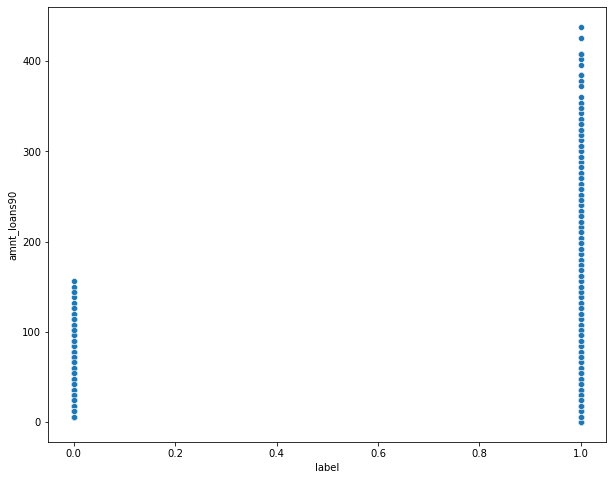

In [56]:
plt.figure(figsize=(10,8))
sns.scatterplot(df['label'],df['amnt_loans90'])
print(df[['label' , 'amnt_loans90']].corr())
plt.show()

                    label  maxamnt_loans30
label            1.000000         0.000248
maxamnt_loans30  0.000248         1.000000


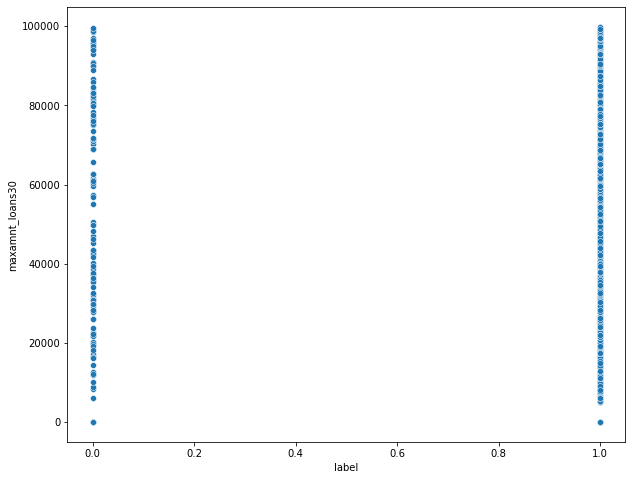

In [57]:
plt.figure(figsize=(10,8))
sns.scatterplot(df['label'],df['maxamnt_loans30'])
print(df[['label' , 'maxamnt_loans30']].corr())
plt.show()

                    label  maxamnt_loans90
label            1.000000         0.084144
maxamnt_loans90  0.084144         1.000000


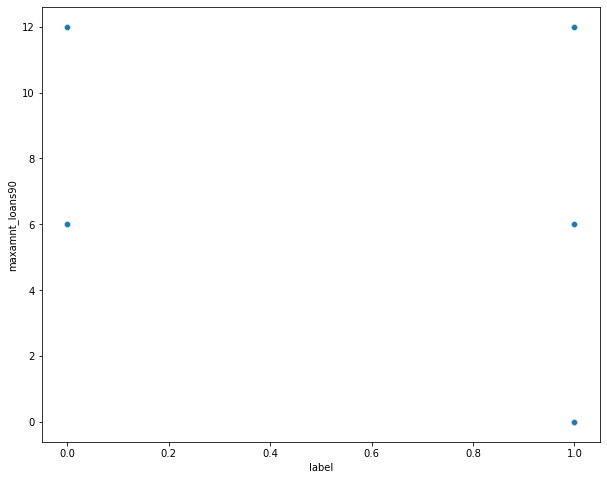

In [58]:
plt.figure(figsize=(10,8))
sns.scatterplot(df['label'],df['maxamnt_loans90'])
print(df[['label' , 'maxamnt_loans90']].corr())
plt.show()

                       label  medianamnt_loans30
label               1.000000            0.044589
medianamnt_loans30  0.044589            1.000000


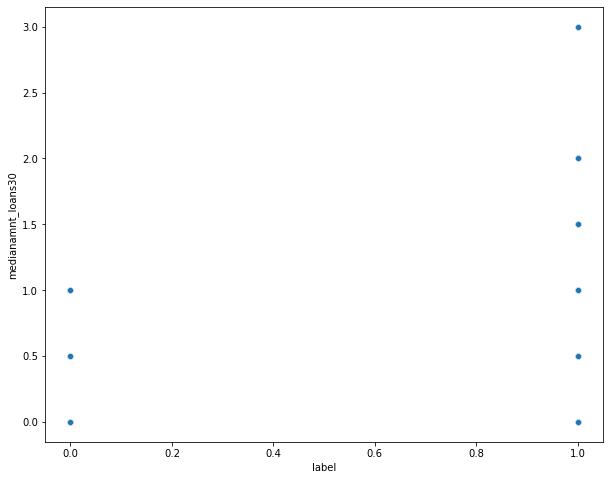

In [59]:
plt.figure(figsize=(10,8))
sns.scatterplot(df['label'],df['medianamnt_loans30'])
print(df[['label' , 'medianamnt_loans30']].corr())
plt.show()

                       label  medianamnt_loans90
label               1.000000            0.035747
medianamnt_loans90  0.035747            1.000000


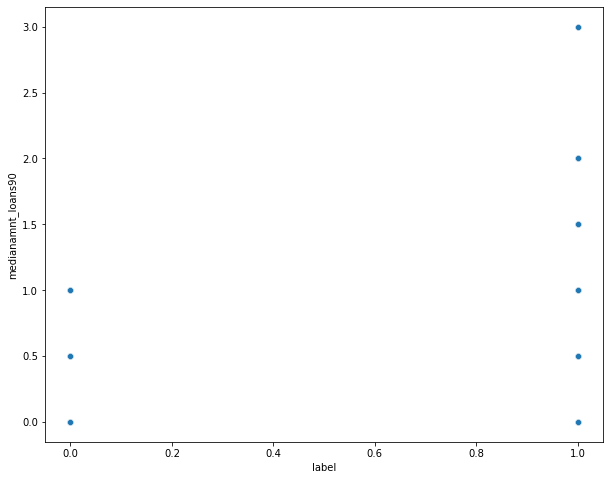

In [60]:
plt.figure(figsize=(10,8))
sns.scatterplot(df['label'],df['medianamnt_loans90'])
print(df[['label' , 'medianamnt_loans90']].corr())
plt.show()

       label
label    1.0


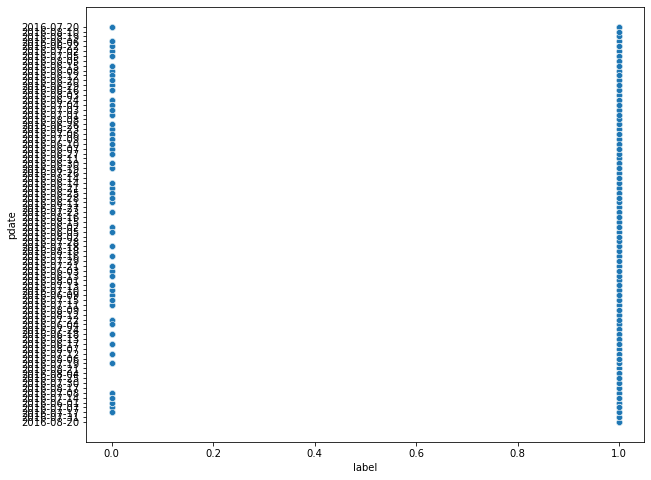

In [61]:
plt.figure(figsize=(10,8))
sns.scatterplot(df['label'],df['pdate'])
print(df[['label' , 'pdate']].corr())
plt.show()

COUNTPLOT

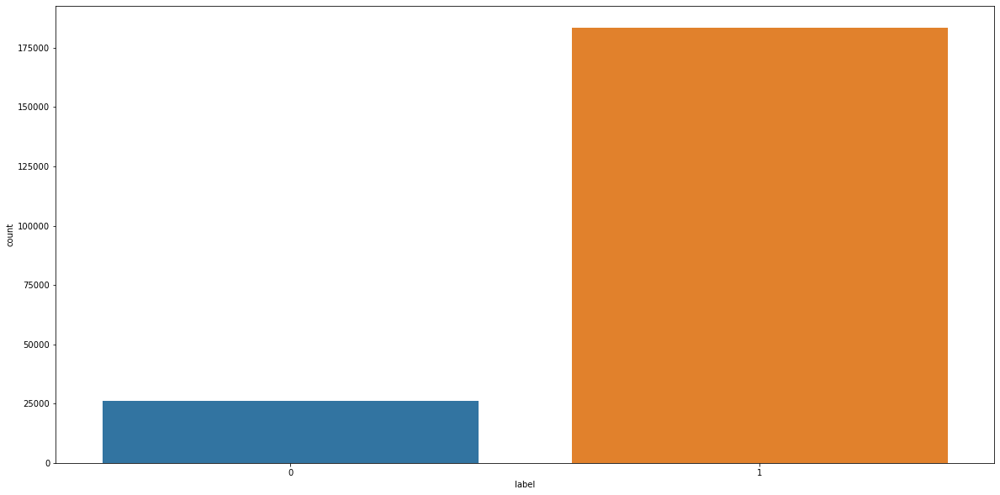

In [62]:
plt.figure(figsize=(20,10))
sns.countplot(df['label'])
plt.show()

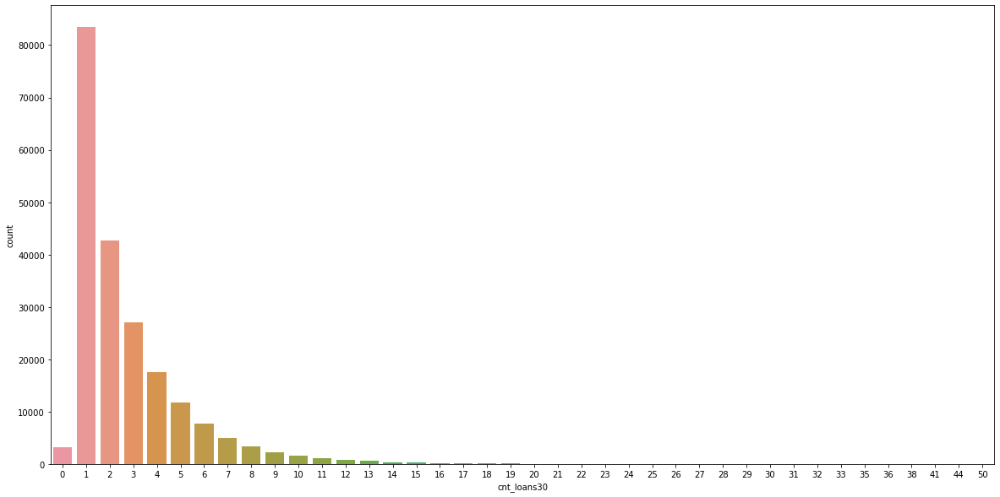

In [63]:
plt.figure(figsize=(20,10))
sns.countplot(df['cnt_loans30'])
plt.show()

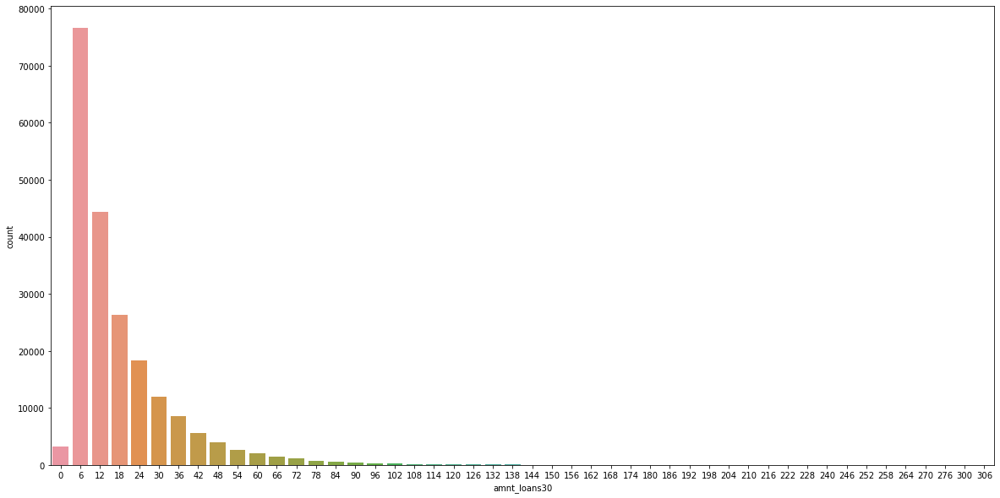

In [64]:
plt.figure(figsize=(20,10))
sns.countplot(df['amnt_loans30'])
plt.show()

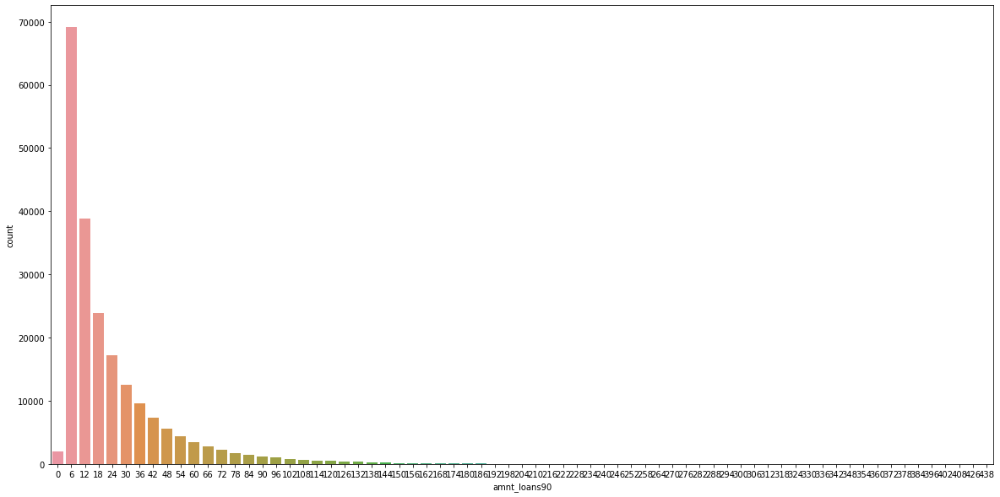

In [65]:
plt.figure(figsize=(20,10))
sns.countplot(df['amnt_loans90'])
plt.show()

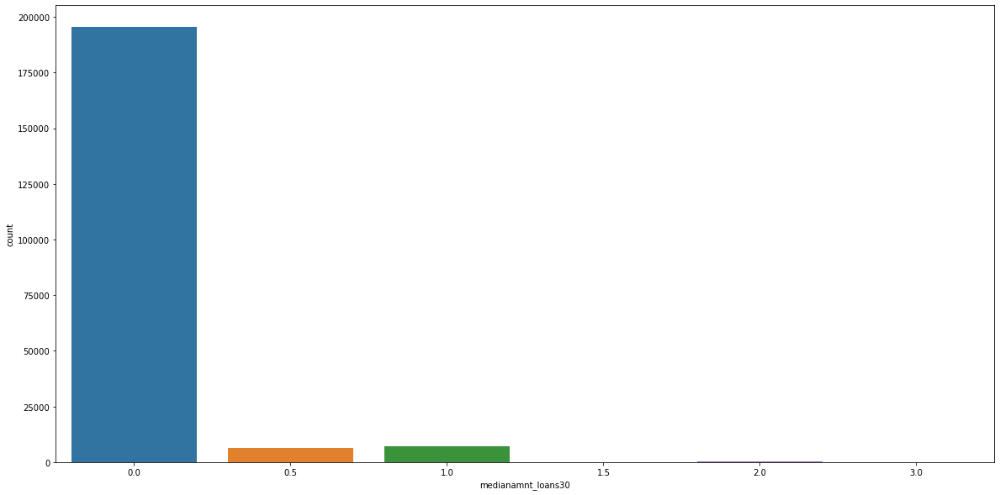

In [66]:
plt.figure(figsize=(20,10))
sns.countplot(df['medianamnt_loans30'])
plt.show()

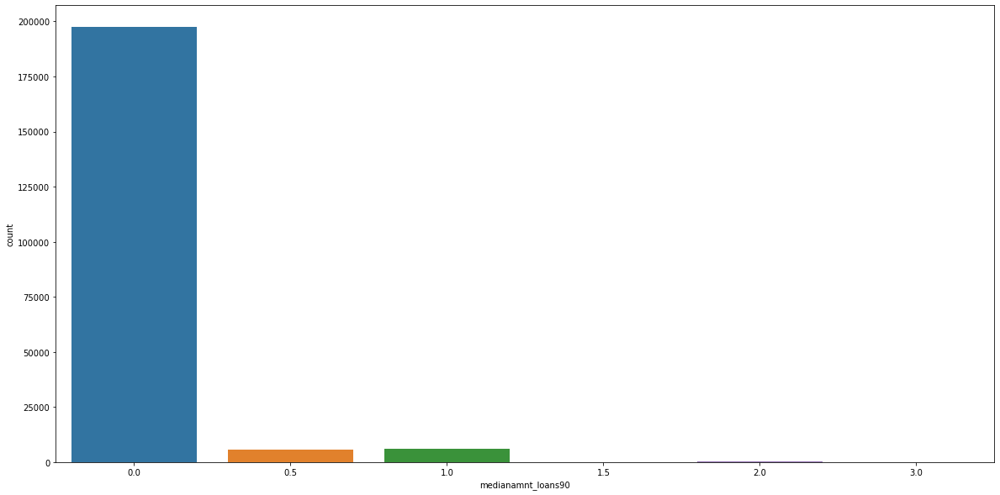

In [67]:
plt.figure(figsize=(20,10))
sns.countplot(df['medianamnt_loans90'])
plt.show()

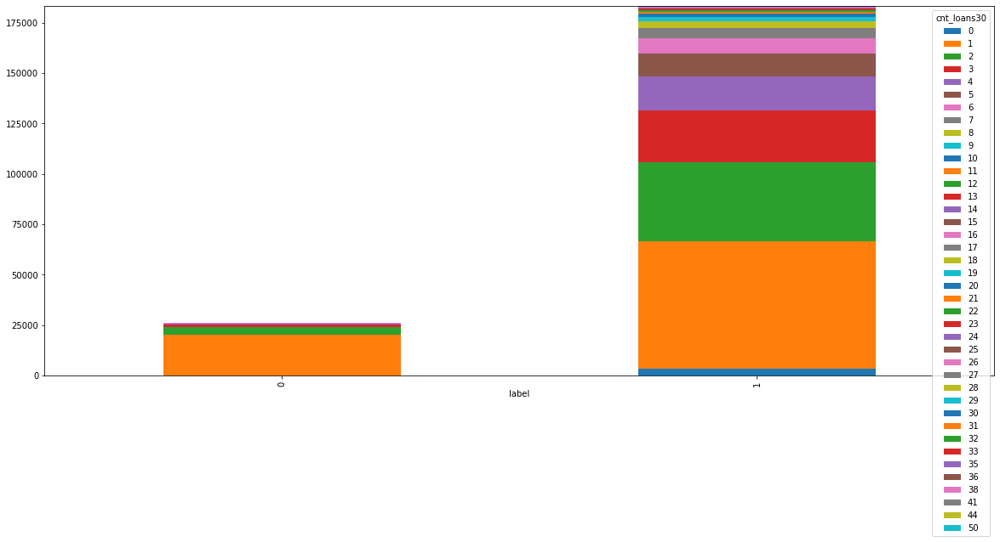

In [68]:
data=pd.crosstab(df['label'],df['cnt_loans30'])
data.plot.bar(stacked=True,figsize=(20,8))
plt.xticks(rotation=90)
plt.show()

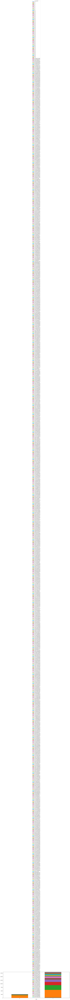

In [69]:
data=pd.crosstab(df['label'],df['cnt_loans90'])
data.plot.bar(stacked=True,figsize=(20,8))
plt.xticks(rotation=90)
plt.show()

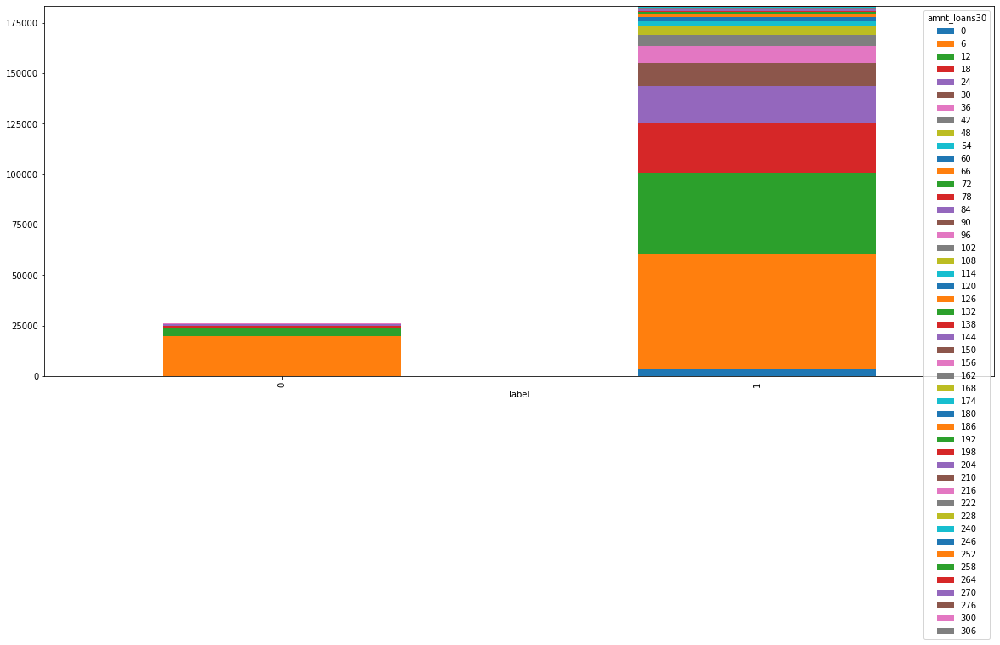

In [70]:
data=pd.crosstab(df['label'],df['amnt_loans30'])
data.plot.bar(stacked=True,figsize=(20,8))
plt.xticks(rotation=90)
plt.show()

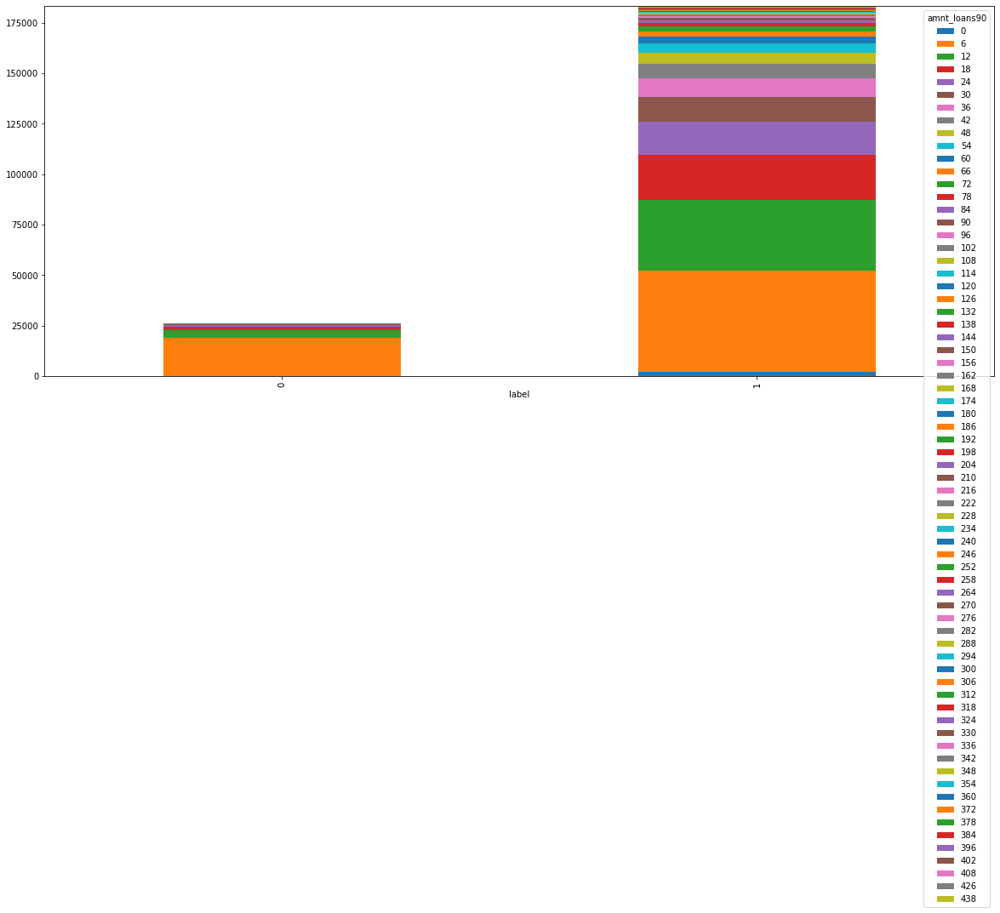

In [71]:
data=pd.crosstab(df['label'],df['amnt_loans90'])
data.plot.bar(stacked=True,figsize=(20,8))
plt.xticks(rotation=90)
plt.show()

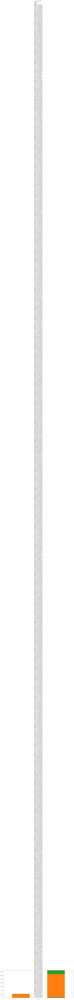

In [72]:
data=pd.crosstab(df['label'],df['maxamnt_loans30'])
data.plot.bar(stacked=True,figsize=(20,8))
plt.xticks(rotation=90)
plt.show()

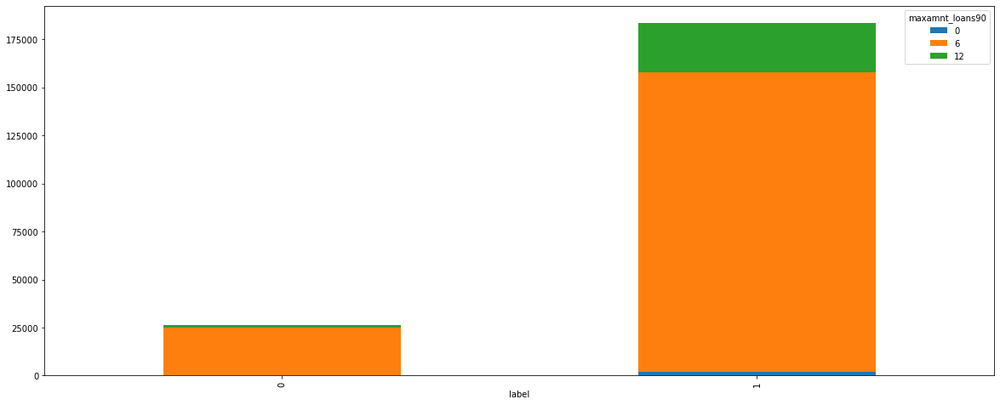

In [73]:
data=pd.crosstab(df['label'],df['maxamnt_loans90'])
data.plot.bar(stacked=True,figsize=(20,8))
plt.xticks(rotation=90)
plt.show()

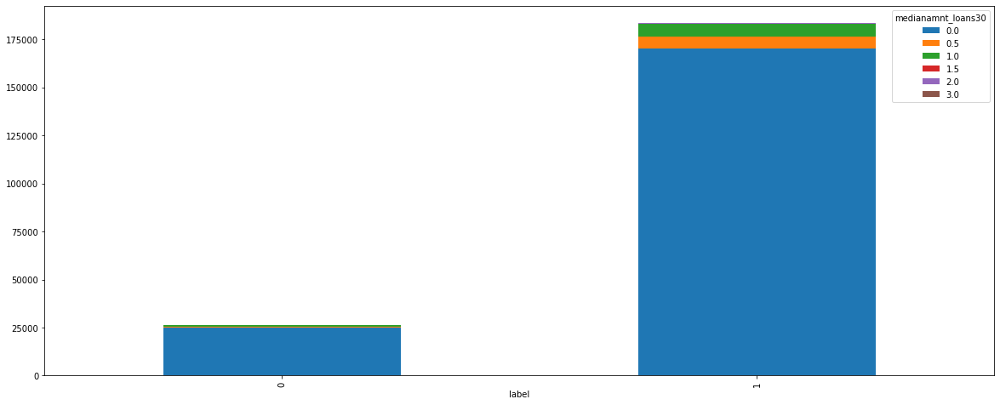

In [74]:
data=pd.crosstab(df['label'],df['medianamnt_loans30'])
data.plot.bar(stacked=True,figsize=(20,8))
plt.xticks(rotation=90)
plt.show()

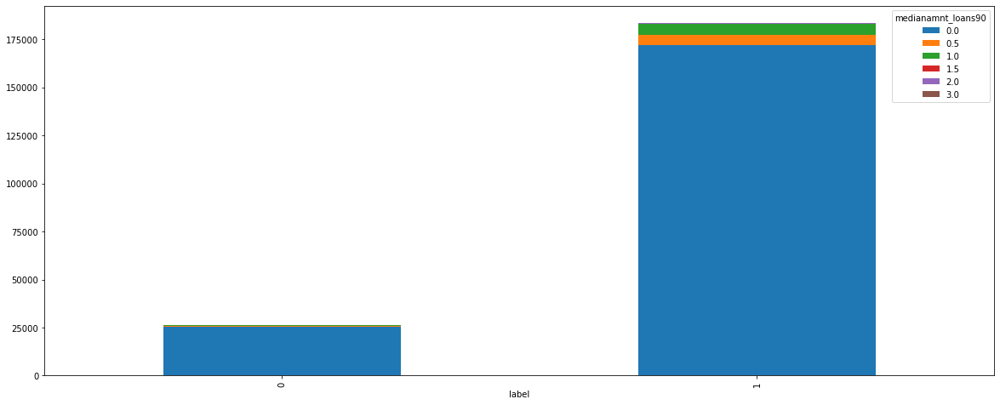

In [75]:
data=pd.crosstab(df['label'],df['medianamnt_loans90'])
data.plot.bar(stacked=True,figsize=(20,8))
plt.xticks(rotation=90)
plt.show()

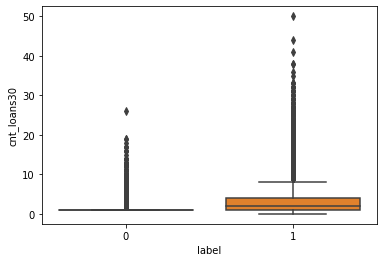

In [76]:
sns.boxplot(x='label',y='cnt_loans30',data=df)
plt.show()

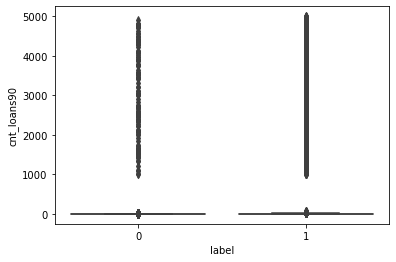

In [77]:
sns.boxplot(x='label',y='cnt_loans90',data=df)
plt.show()

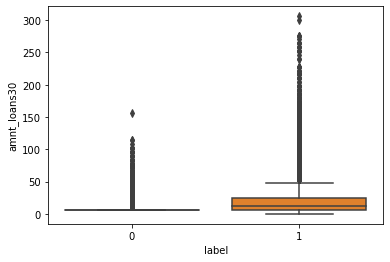

In [78]:
sns.boxplot(x='label',y='amnt_loans30',data=df)
plt.show()

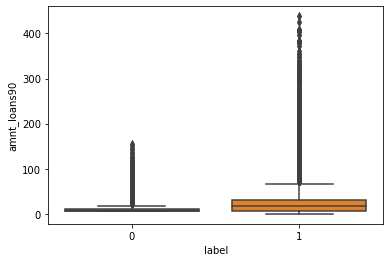

In [79]:
sns.boxplot(x='label',y='amnt_loans90',data=df)
plt.show()

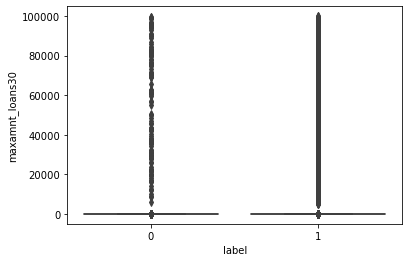

In [80]:
sns.boxplot(x='label',y='maxamnt_loans30',data=df)
plt.show()

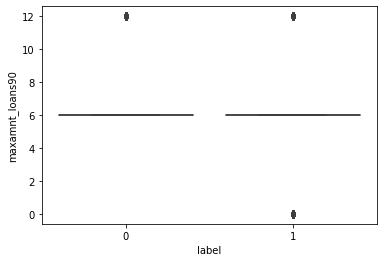

In [81]:
sns.boxplot(x='label',y='maxamnt_loans90',data=df)
plt.show()

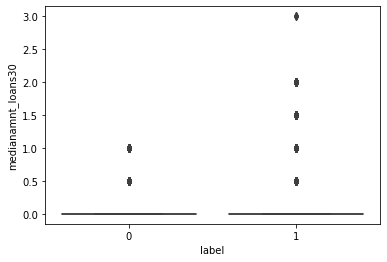

In [82]:
sns.boxplot(x='label',y='medianamnt_loans30',data=df)
plt.show()

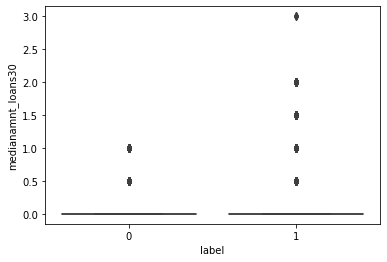

In [83]:
sns.boxplot(x='label',y='medianamnt_loans30',data=df)
plt.show()

LINEPLOT

<AxesSubplot:xlabel='label', ylabel='cnt_loans30'>

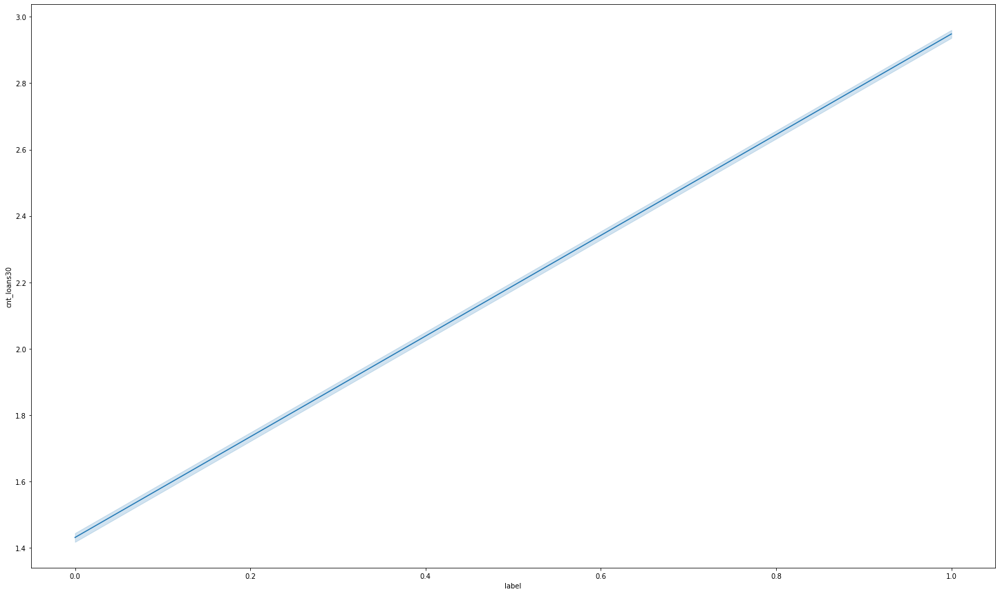

In [84]:
plt.figure(figsize=(25,15))
sns.lineplot(x='label',y='cnt_loans30',data=df)

<AxesSubplot:xlabel='label', ylabel='cnt_loans90'>

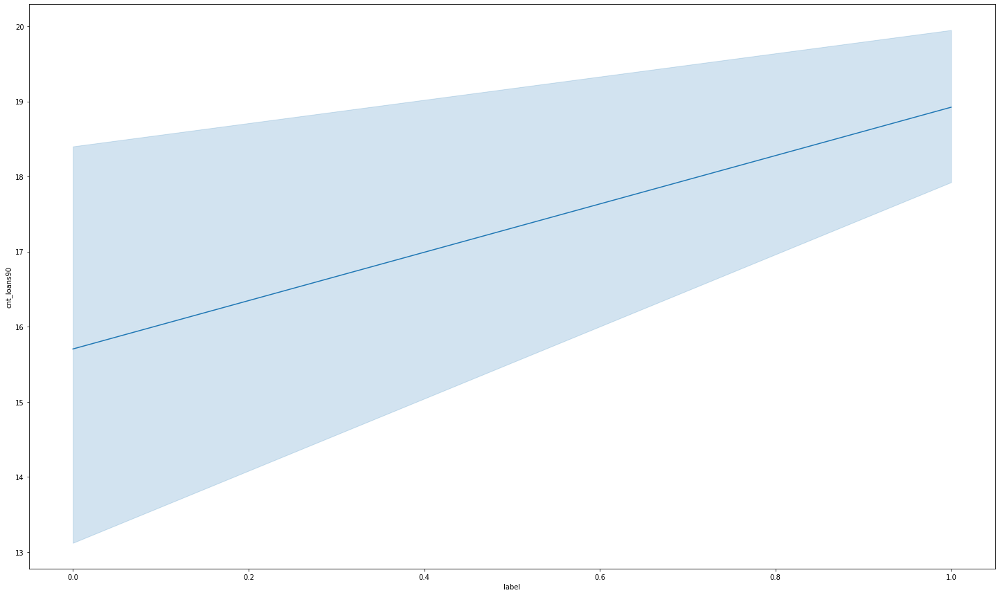

In [85]:
plt.figure(figsize=(25,15))
sns.lineplot(x='label',y='cnt_loans90',data=df)

<AxesSubplot:xlabel='label', ylabel='amnt_loans30'>

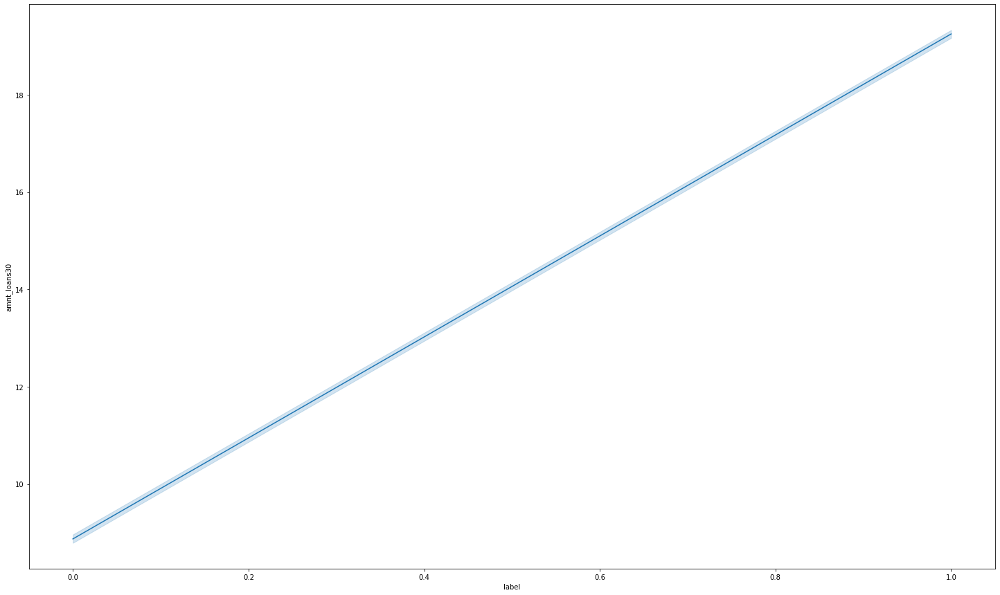

In [86]:
plt.figure(figsize=(25,15))
sns.lineplot(x='label',y='amnt_loans30',data=df)

<AxesSubplot:xlabel='label', ylabel='amnt_loans90'>

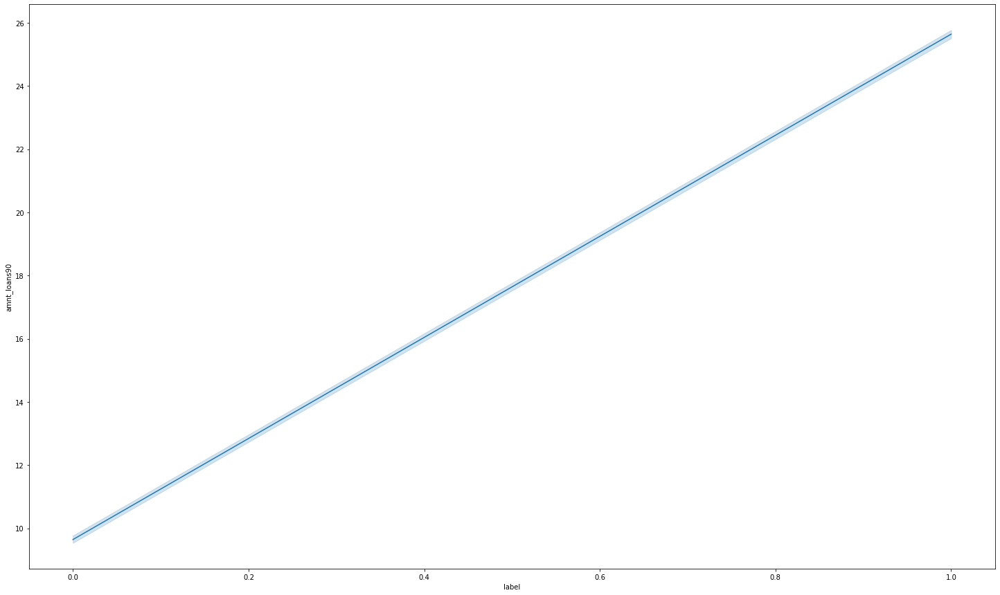

In [87]:
plt.figure(figsize=(25,15))
sns.lineplot(x='label',y='amnt_loans90',data=df)

<AxesSubplot:xlabel='label', ylabel='maxamnt_loans30'>

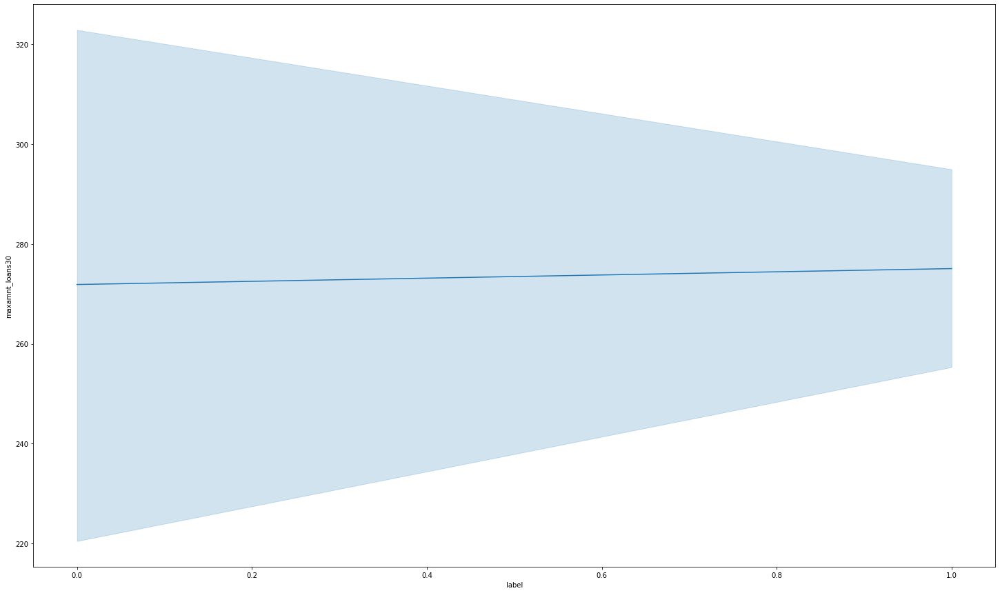

In [88]:
plt.figure(figsize=(25,15))
sns.lineplot(x='label',y='maxamnt_loans30',data=df)

<AxesSubplot:xlabel='label', ylabel='maxamnt_loans90'>

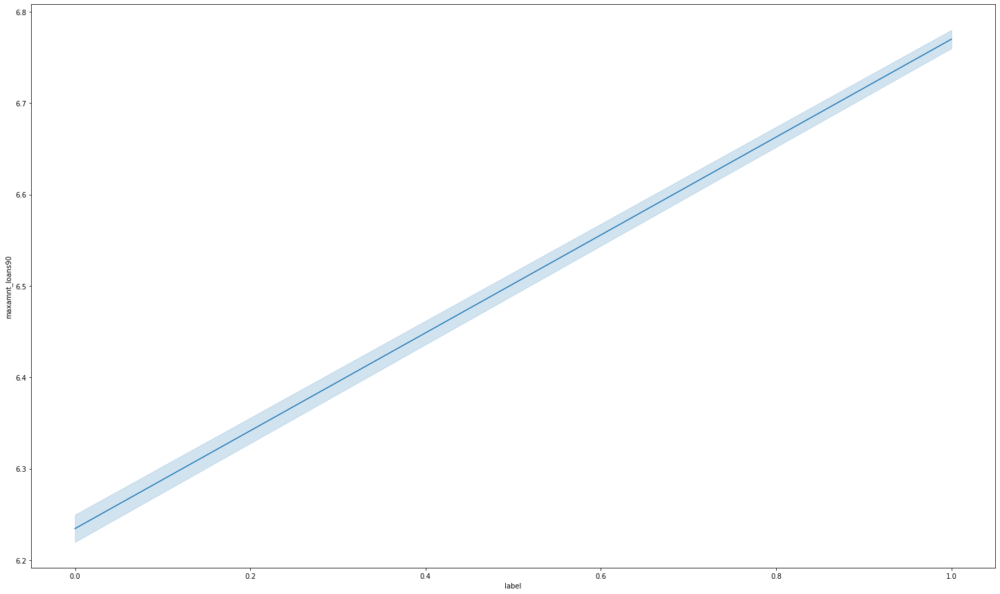

In [89]:
plt.figure(figsize=(25,15))
sns.lineplot(x='label',y='maxamnt_loans90',data=df)

<AxesSubplot:xlabel='label', ylabel='medianamnt_loans30'>

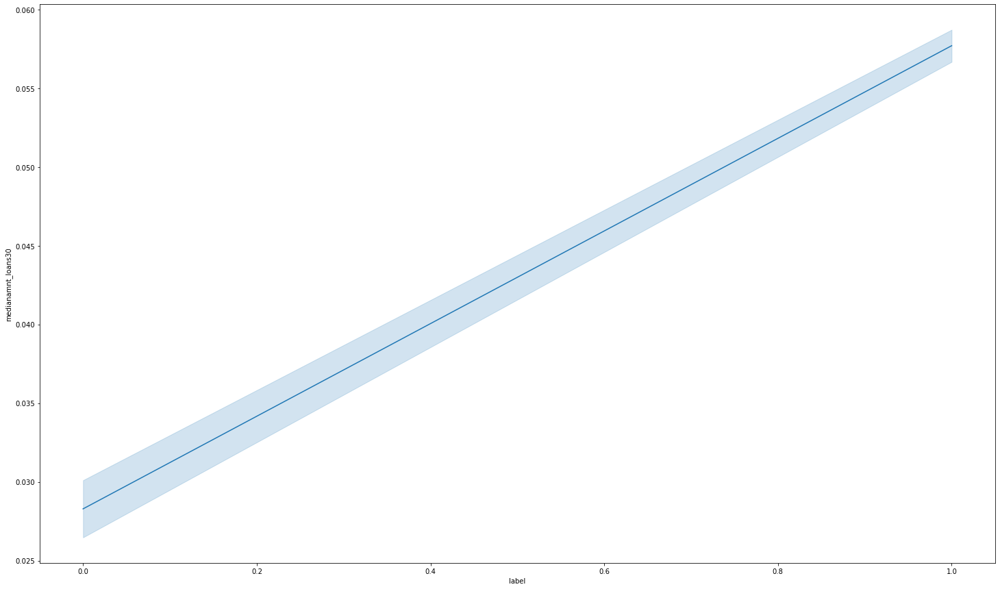

In [90]:
plt.figure(figsize=(25,15))
sns.lineplot(x='label',y='medianamnt_loans30',data=df)

<AxesSubplot:xlabel='label', ylabel='medianamnt_loans90'>

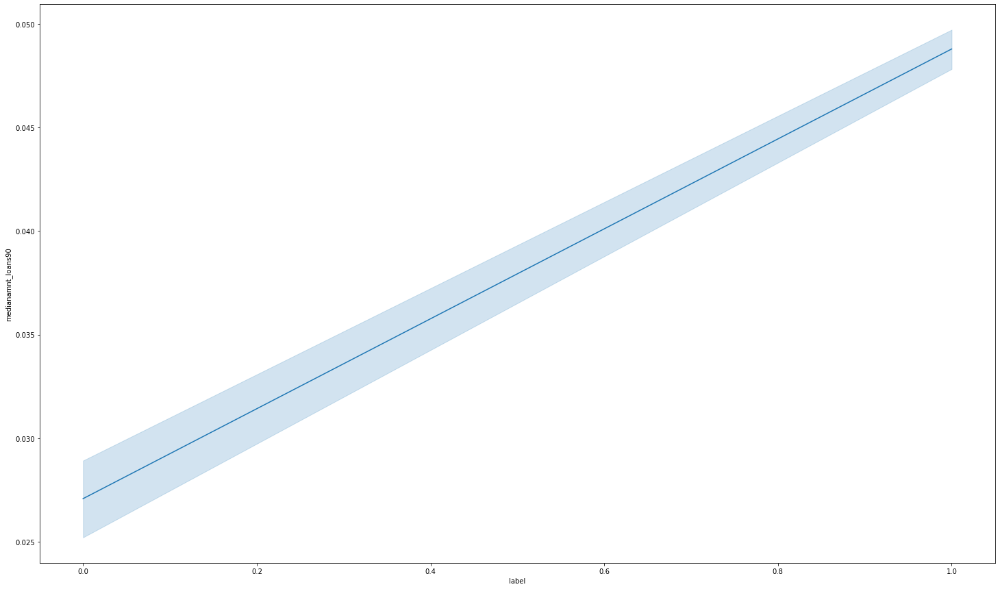

In [91]:
plt.figure(figsize=(25,15))
sns.lineplot(x='label',y='medianamnt_loans90',data=df)

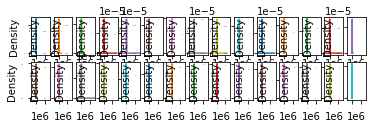

In [92]:
df.plot(kind='density',subplots=True,layout=(5,15),legend=False,fontsize=1);

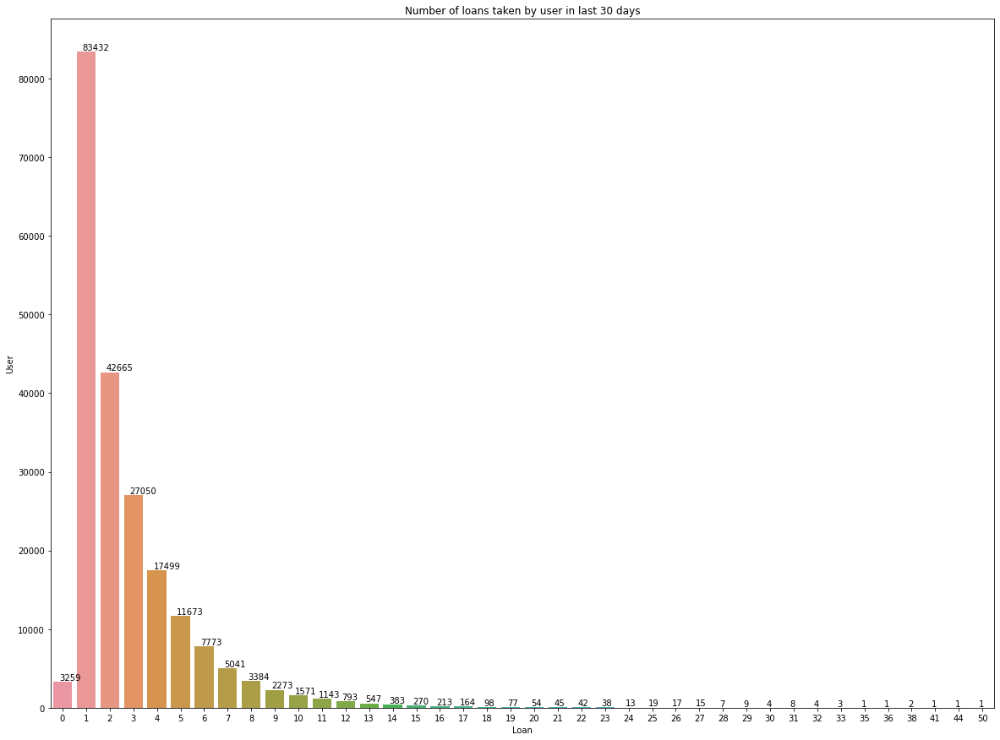

In [93]:
plt.figure(figsize=(20,15))
plt.title('Number of loans taken by user in last 30 days')
ax=sns.countplot(x='cnt_loans30',data=df)
plt.xlabel('Loan')
plt.ylabel('User')
for i  in ax.patches:
    ax.annotate(int(i.get_height()), (i.get_x()+0.25, i.get_height()+1), va='bottom',color='black')

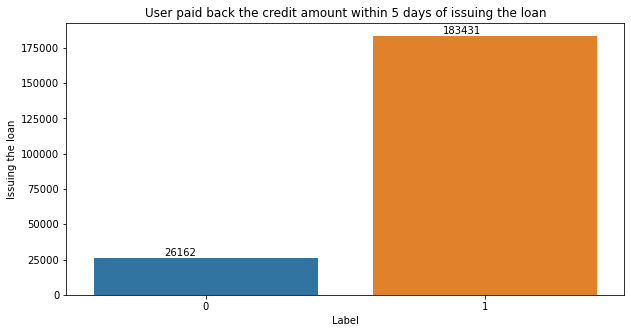

In [94]:
plt.figure(figsize=(10,5))
plt.title('User paid back the credit amount within 5 days of issuing the loan')
ax=sns.countplot(x='label',data=df)
plt.xlabel('Label')
plt.ylabel('Issuing the loan')
for i  in ax.patches:
    ax.annotate(int(i.get_height()), (i.get_x()+0.25, i.get_height()+1), va='bottom',color='black')

RELPLOT

<Figure size 1080x720 with 0 Axes>

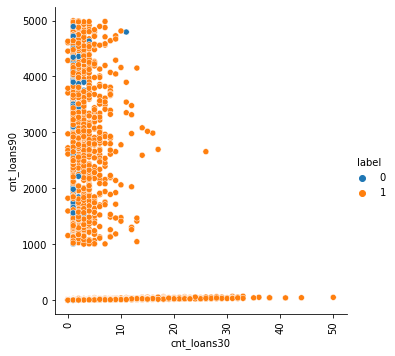

In [95]:
plt.figure(figsize=(15,10))
sns.relplot(x='cnt_loans30', y='cnt_loans90', hue='label',data=df)
plt.xticks(rotation=90);

<Figure size 1080x720 with 0 Axes>

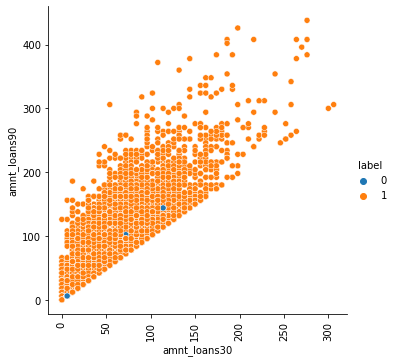

In [96]:
plt.figure(figsize=(15,10))
sns.relplot(x='amnt_loans30', y='amnt_loans90', hue='label',data=df)
plt.xticks(rotation=90);

<AxesSubplot:>

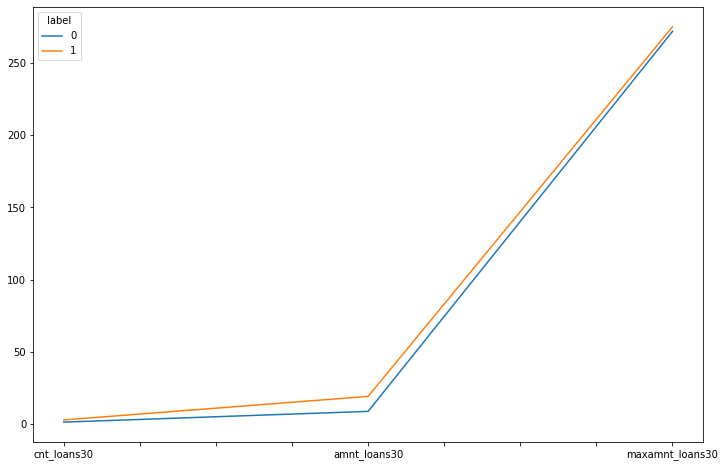

In [97]:
df.groupby('label')[['cnt_loans30' , 'amnt_loans30' , 'maxamnt_loans30']].mean().T.plot(figsize=(12,8))

<AxesSubplot:>

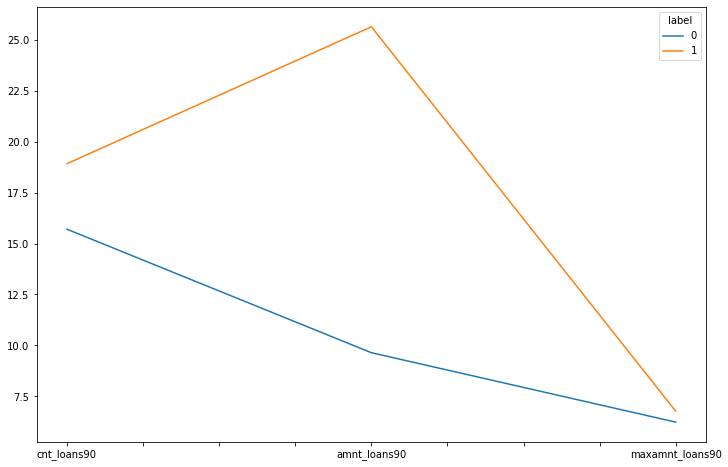

In [98]:
df.groupby('label')[['cnt_loans90' , 'amnt_loans90' , 'maxamnt_loans90']].mean().T.plot(figsize=(12,8))

<AxesSubplot:>

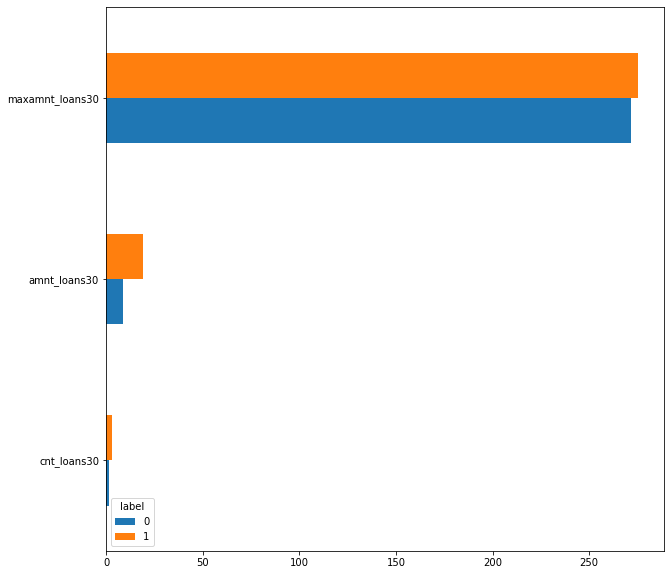

In [99]:
df.groupby('label')[['cnt_loans30' , 'amnt_loans30' , 'maxamnt_loans30']].mean().T.plot(kind='barh',figsize=(10,10))

<AxesSubplot:>

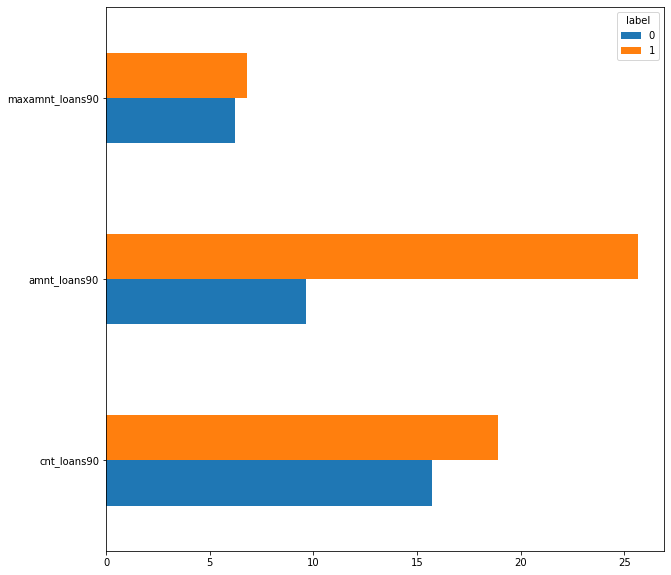

In [100]:
df.groupby('label')[['cnt_loans90' , 'amnt_loans90' , 'maxamnt_loans90']].mean().T.plot(kind='barh',figsize=(10,10))

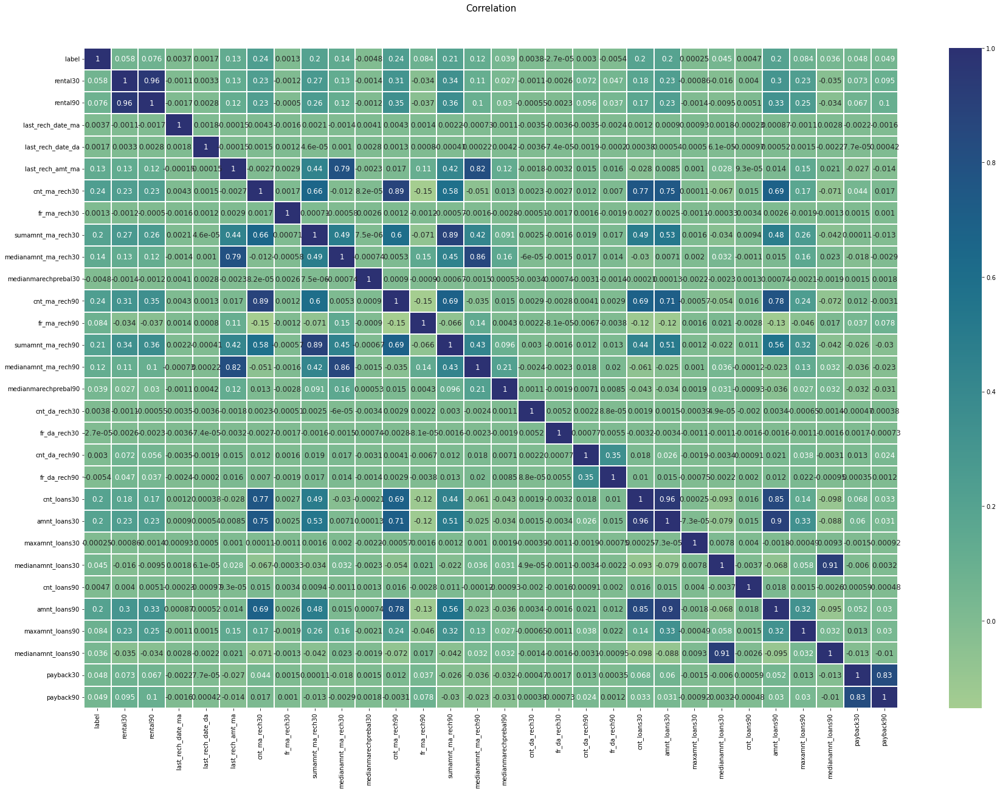

In [101]:
def correlation_heatmap(df):
    ax=plt.subplots(figsize=(30,20))
    colormap=sns.diverging_palette(220, 10, as_cmap = True)
    ax=sns.heatmap(df.corr(),cmap="crest",annot=True,linewidths=0.1,vmax=1.0,linecolor='white',annot_kws={'fontsize':12})
    plt.title('Correlation',y=1.05,size=15)

correlation_heatmap(df)

CATEGORICAL VALUES

In [102]:
c=(df.dtypes=="object")
object_cols=list(c[c].index)
print("categorical values: ")
print(object_cols)

categorical values: 
['pcircle', 'pdate']


In [103]:
for i in object_cols:
    print(i, df[i].isnull().sum())

pcircle 0
pdate 0


In [104]:
for i in object_cols:
    df[i].fillna(df[i].mode()[0],inplace=True)

NUMERICAL VALUES

In [105]:
n=(df.dtypes == "float64")
num_cols=list(n[n].index)
print("Numeric values: ")
print(num_cols)

Numeric values: 
['rental30', 'rental90', 'last_rech_date_ma', 'last_rech_date_da', 'fr_ma_rech30', 'sumamnt_ma_rech30', 'medianamnt_ma_rech30', 'medianmarechprebal30', 'medianamnt_ma_rech90', 'medianmarechprebal90', 'cnt_da_rech30', 'fr_da_rech30', 'maxamnt_loans30', 'medianamnt_loans30', 'cnt_loans90', 'medianamnt_loans90', 'payback30', 'payback90']


In [106]:
for i in num_cols:
    print(i, df[i].isnull().sum())

rental30 0
rental90 0
last_rech_date_ma 0
last_rech_date_da 0
fr_ma_rech30 0
sumamnt_ma_rech30 0
medianamnt_ma_rech30 0
medianmarechprebal30 0
medianamnt_ma_rech90 0
medianmarechprebal90 0
cnt_da_rech30 0
fr_da_rech30 0
maxamnt_loans30 0
medianamnt_loans30 0
cnt_loans90 0
medianamnt_loans90 0
payback30 0
payback90 0


In [107]:
for i in num_cols:
    df[i].fillna(df[i].median(),inplace=True)

In [108]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209593 entries, 0 to 209592
Data columns (total 32 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   label                 209593 non-null  int64  
 1   rental30              209593 non-null  float64
 2   rental90              209593 non-null  float64
 3   last_rech_date_ma     209593 non-null  float64
 4   last_rech_date_da     209593 non-null  float64
 5   last_rech_amt_ma      209593 non-null  int64  
 6   cnt_ma_rech30         209593 non-null  int64  
 7   fr_ma_rech30          209593 non-null  float64
 8   sumamnt_ma_rech30     209593 non-null  float64
 9   medianamnt_ma_rech30  209593 non-null  float64
 10  medianmarechprebal30  209593 non-null  float64
 11  cnt_ma_rech90         209593 non-null  int64  
 12  fr_ma_rech90          209593 non-null  int64  
 13  sumamnt_ma_rech90     209593 non-null  int64  
 14  medianamnt_ma_rech90  209593 non-null  float64
 15  

LABEL ENCODER

In [109]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
for i in object_cols:
    df[i] = label_encoder.fit_transform(df[i])
    
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209593 entries, 0 to 209592
Data columns (total 32 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   label                 209593 non-null  int64  
 1   rental30              209593 non-null  float64
 2   rental90              209593 non-null  float64
 3   last_rech_date_ma     209593 non-null  float64
 4   last_rech_date_da     209593 non-null  float64
 5   last_rech_amt_ma      209593 non-null  int64  
 6   cnt_ma_rech30         209593 non-null  int64  
 7   fr_ma_rech30          209593 non-null  float64
 8   sumamnt_ma_rech30     209593 non-null  float64
 9   medianamnt_ma_rech30  209593 non-null  float64
 10  medianmarechprebal30  209593 non-null  float64
 11  cnt_ma_rech90         209593 non-null  int64  
 12  fr_ma_rech90          209593 non-null  int64  
 13  sumamnt_ma_rech90     209593 non-null  int64  
 14  medianamnt_ma_rech90  209593 non-null  float64
 15  

DATA PREPROCESSING

In [110]:
from sklearn import preprocessing
features=df.drop(['cnt_loans90','pcircle','pdate','payback30','payback90'],axis=1)
target=df['cnt_loans90']
col_names=list(features.columns)
scaler=preprocessing.StandardScaler()
features=scaler.fit_transform(features)
features=pd.DataFrame(features,columns=col_names)
features.describe().T

,count,mean,std,min,25%,50%,75%,max
label,209593.0,1.806183e-15,1.000002,-2.647896,0.377658,0.377658,0.377658,0.377658
rental30,209593.0,-3.398164e-16,1.000002,-6.134212,-0.559851,-0.373444,0.154194,45.544863
rental90,209593.0,2.411532e-17,1.000002,-4.887660,-0.551629,-0.372485,0.124494,34.081361
last_rech_date_ma,209593.0,-2.449357e-16,1.000002,-0.070212,-0.069656,-0.069619,-0.069544,18.456181
last_rech_date_da,209593.0,-4.180683e-15,1.000002,-0.070093,-0.069550,-0.069550,-0.069550,18.650400
last_rech_amt_ma,209593.0,6.270109e-16,1.000002,-0.870790,-0.546003,-0.221637,0.103151,22.328322
cnt_ma_rech30,209593.0,1.151419e-15,1.000002,-0.934677,-0.699718,-0.229802,0.240114,46.761802
fr_ma_rech30,209593.0,6.759602e-16,1.000002,-0.069670,-0.069670,-0.069633,-0.069558,18.564580
sumamnt_ma_rech30,209593.0,-1.859425e-16,1.000002,-0.759843,-0.607963,-0.303415,0.227376,79.134453
medianamnt_ma_rech30,209593.0,1.131901e-15,1.000002,-0.875394,-0.503568,-0.132224,0.053689,25.683624


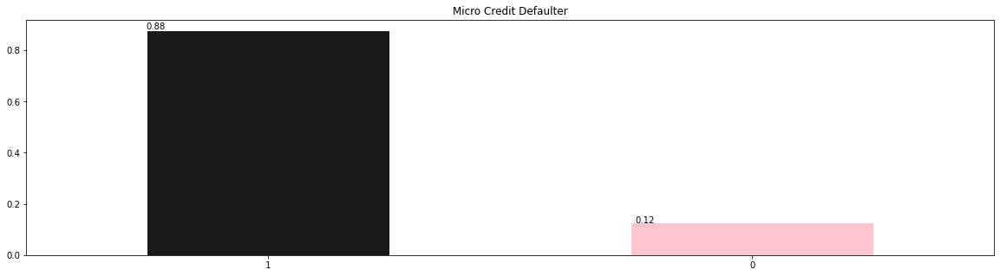

In [111]:
import matplotlib.pyplot as plt
plt.figure(figsize=(20,5))
ax=df.label.value_counts(normalize=True).plot(kind='bar', color=['black', 'pink'], alpha=0.9, rot=0)
plt.title('Micro Credit Defaulter')
for i in ax.patches:
    ax.annotate(str(round(i.get_height(),2)),(i.get_x() * 1.01, i.get_height() * 1.01))
    
plt.show()  

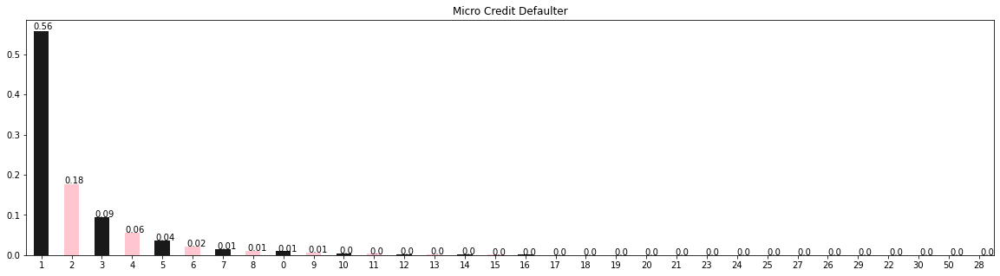

In [112]:
from sklearn.utils import resample

failure=df[df.label == 0]
success=df[df.label == 1]
success_oversampled=resample(success, replace=True, n_samples=len(failure), random_state=42)
oversampled = pd.concat([failure, success_oversampled])

plt.figure(figsize=(20,5))

ax=oversampled.cnt_loans30.value_counts(normalize=True).plot(kind='bar', color=['black', 'pink'], alpha=0.9, rot=0)
plt.title('Micro Credit Defaulter')
for i in ax.patches:
    ax.annotate(str(round(i.get_height(),2)),(i.get_x() * 1.01, i.get_height() * 1.01))
    
plt.show()   

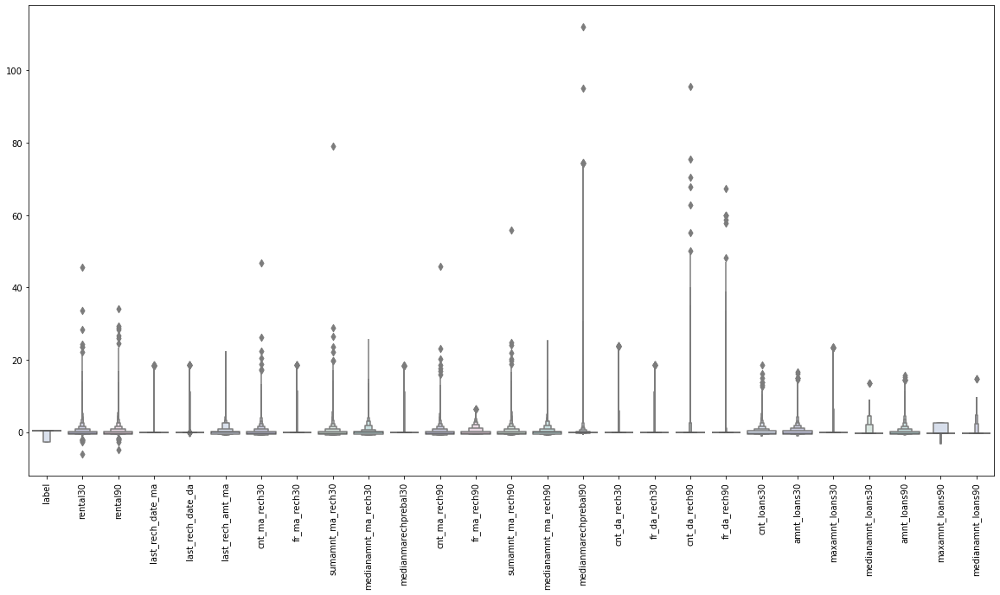

In [113]:
color=["#D0DBEE", "#C2C4E2", "#EED4E5", "#D1E6DC", "#BDE2E2"]
plt.figure(figsize=(20,10))
sns.boxenplot(data=features,palette=color)
plt.xticks(rotation=90)
plt.show()

<AxesSubplot:>

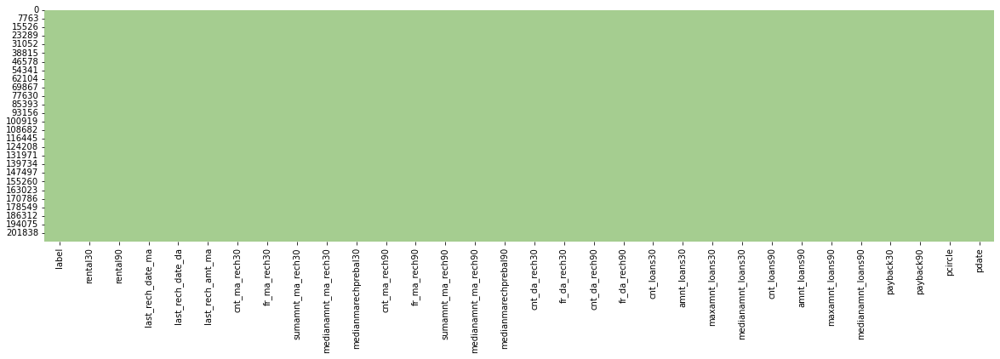

In [114]:
plt.figure(figsize=(20,5))
sns.heatmap(df.isnull(),cbar=False,cmap='crest')

DATA CLEANING

In [115]:
total=oversampled.isnull().sum().sort_values(ascending=False)
percent = (oversampled.isnull().sum()/oversampled.isnull().count()).sort_values(ascending=False)
missing = pd.concat([total, percent], axis=1, keys=['Total' , 'Percent'])
missing.head()

,Total,Percent
label,0,0.0
rental30,0,0.0
pcircle,0,0.0
payback90,0,0.0
payback30,0,0.0


In [116]:
oversampled.select_dtypes(include=['object']).columns

Index([], dtype='object')

In [117]:
oversampled['label'] = oversampled['label'].fillna(oversampled['label'].mode()[0])
oversampled['cnt_loans30'] = oversampled['cnt_loans30'].fillna(oversampled['cnt_loans30'].mode()[0])
oversampled['pcircle'] = oversampled['pcircle'].fillna(oversampled['pcircle'].mode()[0])
oversampled['pdate'] = oversampled['pdate'].fillna(oversampled['pdate'].mode()[0])

convert categorical features to continous features

In [118]:
from sklearn.preprocessing import LabelEncoder
LE={}
for col in df.select_dtypes(include=['object']).columns: 
    LE[col] = LabelEncoder()
    df[col]=LE[col].fit_transform(oversampled[col])

In [119]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
MiceImputed=df.copy(deep=True)
mice_imputer=IterativeImputer()
MiceImputed.iloc[:, :] = mice_imputer.fit_transform(df)

OUTLIERS WITH IQR

In [120]:
Q1=MiceImputed.quantile(0.25)
Q3=MiceImputed.quantile(0.75)
IQR=Q3-Q1
print(IQR)

label                       0.00
rental30                 3076.52
rental90                 3901.53
last_rech_date_ma           6.00
last_rech_date_da           0.00
last_rech_amt_ma         1539.00
cnt_ma_rech30               4.00
fr_ma_rech30                6.00
sumamnt_ma_rech30        8470.00
medianamnt_ma_rech30     1154.00
medianmarechprebal30       72.00
cnt_ma_rech90               6.00
fr_ma_rech90                8.00
sumamnt_ma_rech90       13683.00
medianamnt_ma_rech90     1151.00
medianmarechprebal90       64.71
cnt_da_rech30               0.00
fr_da_rech30                0.00
cnt_da_rech90               0.00
fr_da_rech90                0.00
cnt_loans30                 3.00
amnt_loans30               18.00
maxamnt_loans30             0.00
medianamnt_loans30          0.00
cnt_loans90                 4.00
amnt_loans90               24.00
maxamnt_loans90             0.00
medianamnt_loans90          0.00
payback30                   3.75
payback90                   4.50
pcircle   

In [121]:
type(df)

pandas.core.frame.DataFrame

REMOVE THE OUTLIERS

In [122]:
MiceImputed = MiceImputed[~((MiceImputed < (Q1 - 1.5 * IQR)) |(MiceImputed > (Q3 + 1.5 * IQR))).any(axis=1)]
MiceImputed.shape

(58174, 32)

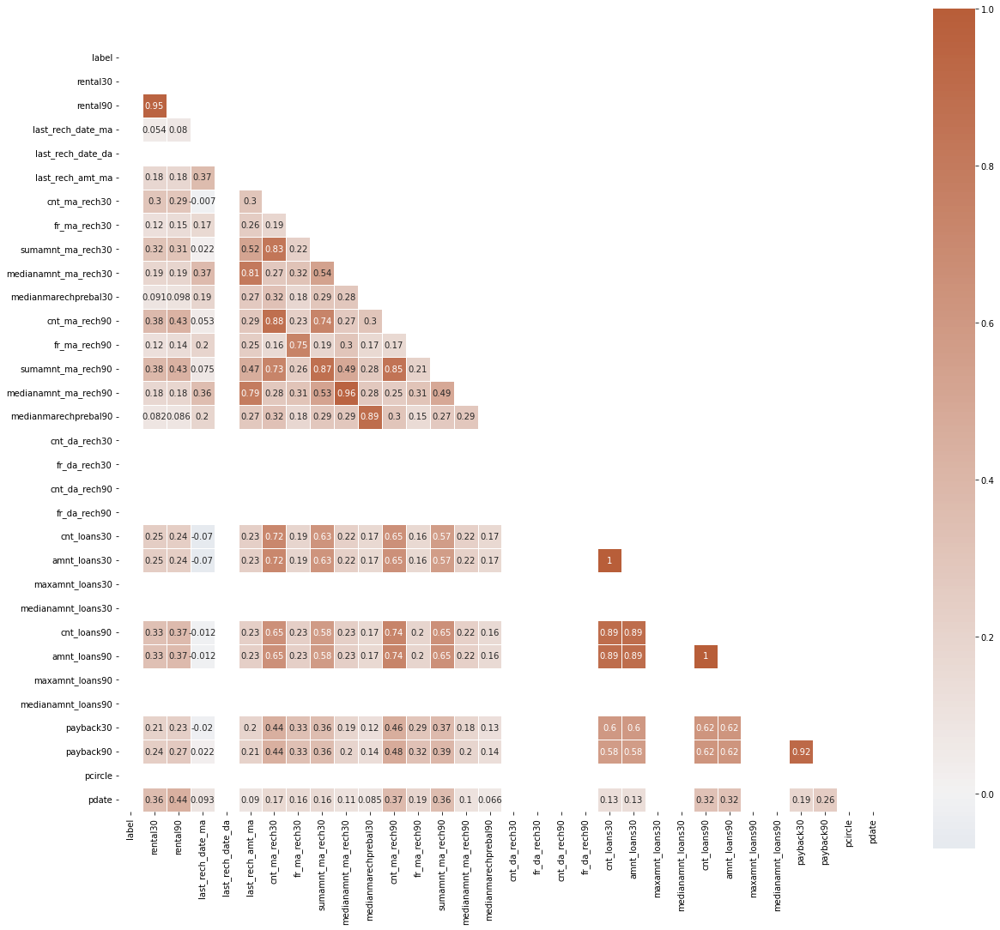

In [123]:
corr = MiceImputed.corr()
mask = np.triu(np.ones_like(corr, dtype=np.bool))
f, ax = plt.subplots(figsize=(20,20))
cmap = sns.diverging_palette(250, 25, as_cmap=True)
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=None, center=0,square=True, annot=True, linewidths=.5, cbar_kws={"shrink": .9})
plt.show()

BUILDING MODELS

In [124]:
from sklearn.model_selection import train_test_split
X=features.drop(["cnt_loans30"],axis=1)
y=features["cnt_loans30"]
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)
X.shape

(209593, 26)

In [125]:
# Standardizing data
from sklearn import preprocessing
r_scaler = preprocessing.MinMaxScaler()
r_scaler.fit(MiceImputed)
modified_data=pd.DataFrame(r_scaler.transform(MiceImputed), index=MiceImputed.index, columns=MiceImputed.columns)

In [126]:
#Feature Importance using Filter Method(Chi-Square)
from sklearn.feature_selection import SelectKBest, chi2
X = modified_data.loc[:, modified_data.columns != 'label']
y = modified_data[['label']]
selector = SelectKBest(chi2, k=10)
selector.fit(X,y)
X_new = selector.transform(X)
print(X.columns[selector.get_support(indices=True)])

Index(['maxamnt_loans30', 'medianamnt_loans30', 'cnt_loans90', 'amnt_loans90',
       'maxamnt_loans90', 'medianamnt_loans90', 'payback30', 'payback90',
       'pcircle', 'pdate'],
      dtype='object')


In [127]:
 from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestClassifier as rf

X = MiceImputed.drop('label', axis=1)
y=MiceImputed['label']
selector = SelectFromModel(rf(n_estimators=100,random_state=0))
selector.fit(X,y)
support=selector.get_support()
features=X.loc[:, support].columns.tolist()
print(features)
print(rf(n_estimators=100,random_state=0).fit(X,y).feature_importances_)

['rental30', 'rental90', 'last_rech_date_ma', 'last_rech_date_da', 'last_rech_amt_ma', 'cnt_ma_rech30', 'fr_ma_rech30', 'sumamnt_ma_rech30', 'medianamnt_ma_rech30', 'medianmarechprebal30', 'cnt_ma_rech90', 'fr_ma_rech90', 'sumamnt_ma_rech90', 'medianamnt_ma_rech90', 'medianmarechprebal90', 'cnt_da_rech30', 'fr_da_rech30', 'cnt_da_rech90', 'fr_da_rech90', 'cnt_loans30', 'amnt_loans30', 'maxamnt_loans30', 'medianamnt_loans30', 'cnt_loans90', 'amnt_loans90', 'maxamnt_loans90', 'medianamnt_loans90', 'payback30', 'payback90', 'pcircle', 'pdate']
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0.]


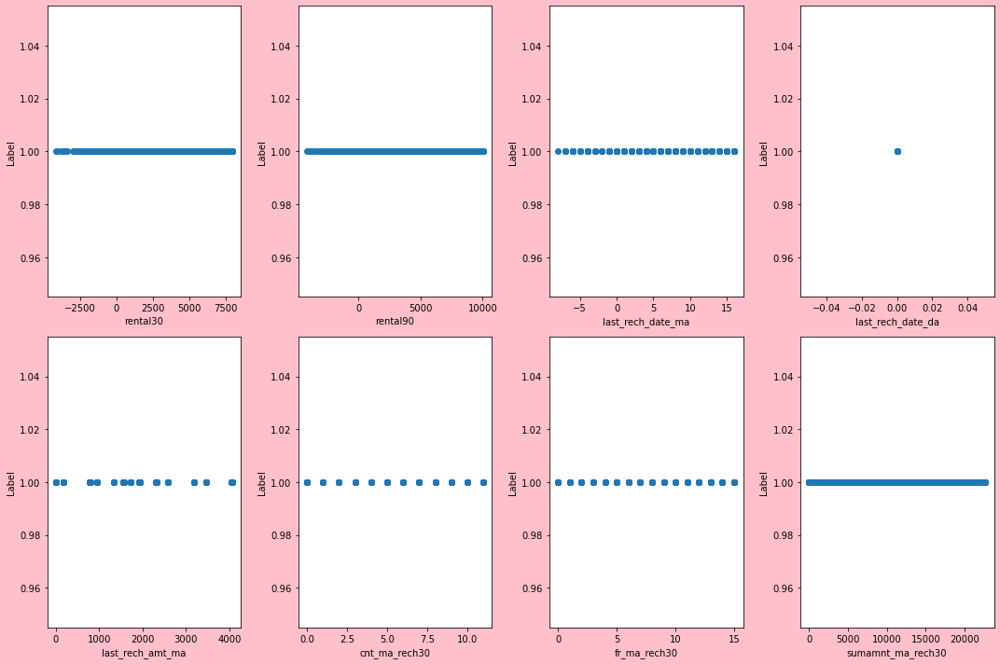

In [128]:
# Visualizing relationship
plt.figure(figsize=(15,10), facecolor= 'pink')
plotnumber  =  1

for column in X:
    if plotnumber<=8  :
        aX  =  plt.subplot(2,4,plotnumber)
        plt.scatter(X[column],y)
        plt.xlabel(column,fontsize=10)
        plt.ylabel('Label',fontsize=10)
    plotnumber+=1
plt.tight_layout()    

In [129]:
from sklearn.preprocessing import StandardScaler
# Data Scaling Formula Z=(x-mean)/std
scaler = StandardScaler()
X_scaled=scaler.fit_transform(X)
X_scaled

array([[-0.23621479, -0.31934721, -0.13811893, ..., -0.85648223,
         0.        ,  2.24155209],
       [-0.11036683, -0.21530584,  0.149985  , ...,  0.02496435,
         0.        , -0.44262019],
       [ 0.64217573,  0.40683817, -0.7143268 , ...,  0.15088528,
         0.        , -0.76657202],
       ...,
       [-0.71720003, -0.71698862,  0.149985  , ..., -0.85648223,
         0.        , -1.36819684],
       [-0.11651456, -0.22038831, -0.7143268 , ..., -0.47871941,
         0.        , -0.67401435],
       [ 0.28816543,  0.11416982,  0.149985  , ..., -0.47871941,
         0.        , -0.90540852]])

In [130]:
regression=LinearRegression()
regression.fit(X_train,y_train)

LinearRegression()

In [131]:
# Adjusted R2 score
regression.score(X_train,y_train)

0.9555764509034571

In [132]:
regression.score(X_test,y_test)

0.9531666388767995

In [133]:
y_pred = regression.predict(X_test)
y_pred

array([ 0.45092892, -0.68693547, -0.6135218 , ...,  0.21967141,
       -0.26036992, -0.67005551])

BIVARIATE ANALYSIS

<function matplotlib.pyplot.show(close=None, block=None)>

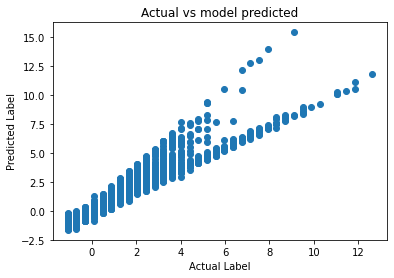

In [134]:
plt.scatter(y_test,y_pred)
plt.xlabel('Actual Label')
plt.ylabel('Predicted Label')
plt.title('Actual vs model predicted')
plt.show

MODEL EVALUATION

In [135]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
y_pred=regression.predict(X_test)

In [136]:
mean_absolute_error(y_test,y_pred)

0.1042343585709731

In [137]:
mean_squared_error(y_test,y_pred)

0.04736428166250717

In [138]:
np.sqrt(mean_squared_error(y_test,y_pred))

0.21763336523269397

LASSO REGULARIZATION

In [139]:
from sklearn.linear_model  import Ridge,Lasso,RidgeCV, LassoCV
from sklearn.model_selection import GridSearchCV
# LassoCV will return bestalpha after max iteration
#Normalize is subtracting the mean and dividing by the L2-norm

lassoregularization=Lasso()
parameters={'alpha':[1,2,5,10,20,30,40,50,60,70,80,90]}

lasscv=GridSearchCV(lassoregularization,parameters,scoring='neg_mean_squared_error', n_jobs=-1,cv=5)


lasscv  =  LassoCV(alphas  =  None, max_iter  =  100, normalize  =  True)
lasscv.fit(X_train, y_train)

LassoCV(max_iter=100, normalize=True)

In [140]:
#best alpha parameter
alpha  =  lasscv.alpha_
alpha

2.3362417567336936e-06

In [141]:
#now that we have best parameter, Let's use Lasso regression and see how well our data has fitted before

lasso_reg  =  Lasso(alpha)
lasso_reg.fit(X_train, y_train)

Lasso(alpha=2.3362417567336936e-06)

In [142]:
lasso_reg.score(X_test,y_test)

0.9531667394470874

USING RIDGE REGRESSION MODEL

In [143]:
# RidgeCV will return best alpha and coefficients after performing 10 cross validations.

ridge_regressor=Ridge()
parameters={'alpha':[1,2,5,10,20,30,40,50,60,70,80,90]}

ridgecv=GridSearchCV(ridge_regressor,parameters,scoring='neg_mean_squared_error',cv=5)

ridgecv.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [1, 2, 5, 10, 20, 30, 40, 50, 60, 70, 80,
                                   90]},
             scoring='neg_mean_squared_error')

In [144]:
types=MiceImputed[['cnt_loans30' , 'rental30', 'rental90', 'last_rech_date_ma', 'last_rech_date_da', 'last_rech_amt_ma', 'cnt_ma_rech30', 'fr_ma_rech30', 'sumamnt_ma_rech30', 'medianamnt_ma_rech30', 'medianmarechprebal30', 'cnt_ma_rech90','fr_ma_rech90', 'sumamnt_ma_rech90', 'medianamnt_ma_rech90', 'medianmarechprebal90','cnt_da_rech30','fr_da_rech30','cnt_da_rech90','fr_da_rech90']]
target=MiceImputed['label']
#split into test and train
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(types, target, test_size=0.2, random_state=42, shuffle = True, stratify = target)
#Normalize features
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
X_train=scaler.fit_transform(X_train)
X_test=scaler.fit_transform(X_test)

In [145]:
def plot_roc_cur(fper,tper):
    plt.plot(fper,tper,color='orange', label='ROC')
    plt.plot([0,1],[0,1], color='darkblue',linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend()
    plt.show()

In [146]:
import time
from sklearn.metrics import accuracy_score,roc_auc_score,cohen_kappa_score, plot_confusion_matrix,roc_curve,classification_report
def run_model(model, X_train, y_train,X_test,y_test, verbose=True):
    t0=time.time()
    if verbose == False:
        model.fit(X_train,y_train,verbose=0)
    else:
        model.fit(X_train,y_train)
    y_pred = model.predict(X_test)
    accuracy=accuracy_score(y_test,y_pred)
    roc_auc = roc_auc_score(y_test,y_pred)
    c_kap=cohen_kappa_score(y_test,y_pred)
    time_taken=time.time()-t0
    print("Accuracy = {}".format(roc_auc))
    print("ROC Area under Curve = {} ".format(roc_auc))
    print("Cohen kappa = {}".format(c_kap))
    print("Time taken = {}".format(time_taken))
    print(classification_report(y_test,y_pred,digits=5))
    
    probs = model.predict_proba(X_test)  
    probs = probs[:, 1]  
    fper, tper, thresholds = roc_curve(y_test, probs) 
    plot_roc_cur(fper, tper)
    
    plot_confusion_matrix(model, X_test, y_test,cmap=plt.cm.Blues, normalize = 'all')
    
    return model, accuracy, roc_auc, c_kap, time_taken

In [147]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
log_reg=LogisticRegression()
parameter ={'penalty':['l1','l2','elasticnet'],'C':[1,2,3,4,5,6,10,20,30,40,50],'max_iter':[100,200,300]}
classifier=log_reg
classifier_regressor=GridSearchCV(classifier,param_grid=parameter,scoring='accuracy',cv=5)


ROC-AUC CURVE

Failure: ROC AUC=0.500
Success: ROC AUC=0.903


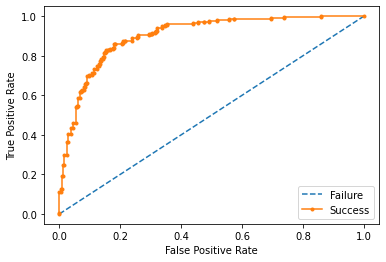

In [148]:
X, y = make_classification(n_samples=1000, n_classes=2, random_state=1)

# split into train/test sets
trainX, testX, trainy, testy = train_test_split(X, y, test_size=0.5, random_state=2)

# generate a no skill prediction (majority class)
ns_probs = [0 for _ in range(len(testy))]

# fit a model
model = LogisticRegression(solver='lbfgs')
model.fit(trainX, trainy)

# predict probabilities
lr_probs = model.predict_proba(testX)

# keep probabilities for the positive outcome only
lr_probs = lr_probs[:, 1]

# calculate scores
ns_auc = roc_auc_score(testy, ns_probs)
lr_auc = roc_auc_score(testy, lr_probs)

# summarize scores
print('Failure: ROC AUC=%.3f' % (ns_auc))
print('Success: ROC AUC=%.3f' % (lr_auc))

# calculate roc curves
ns_fpr, ns_tpr, _ = roc_curve(testy, ns_probs)
lr_fpr, lr_tpr, _ = roc_curve(testy, lr_probs)

# plot the roc curve for the model
pyplot.plot(ns_fpr, ns_tpr, linestyle='--', label='Failure')
pyplot.plot(lr_fpr, lr_tpr, marker='.', label='Success')

# axis labels
pyplot.xlabel('False Positive Rate')
pyplot.ylabel('True Positive Rate')

# show the legend
pyplot.legend()

# show the plot
pyplot.show() 

PRECISION-RECALL CURVE AND F1

Success: f1=0.841 auc=0.898


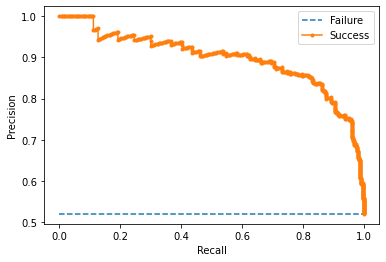

In [149]:
X, y = make_classification(n_samples=1000, n_classes=2, random_state=1)

# split into train/test sets
trainX, testX, trainy, testy = train_test_split(X, y, test_size=0.5, random_state=2)

# fit a model
model = LogisticRegression(solver='lbfgs')
model.fit(trainX, trainy)

# predict probabilities
lr_probs = model.predict_proba(testX)

# keep probabilities for the positive outcome only
lr_probs = lr_probs[:, 1]

# predict class values
yhat = model.predict(testX)
lr_precision, lr_recall, _ = precision_recall_curve(testy, lr_probs)
lr_f1, lr_auc = f1_score(testy, yhat), auc(lr_recall, lr_precision)

# summarize scores
print('Success: f1=%.3f auc=%.3f' % (lr_f1, lr_auc))

# plot the precision-recall curves
no_skill = len(testy[testy==1]) / len(testy)
pyplot.plot([0, 1], [no_skill, no_skill], linestyle='--', label='Failure')
pyplot.plot(lr_recall, lr_precision, marker='.', label='Success')

# axis labels
pyplot.xlabel('Recall')
pyplot.ylabel('Precision')

# show the legend
pyplot.legend()

# show the plot
pyplot.show()

USING GRADIENT BOOSTING CLASSIFIER 

In [150]:
X_train=df['maxamnt_loans30']
X_test=df['maxamnt_loans90']
y=df.label

In [151]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

scaler=StandardScaler()
X_train=X_train.values.reshape(-1,1)
X_test = X_test.values.reshape(-1,1)
X_train, X_test, y_train, y_test = train_test_split(X_train, y, test_size=0.3,random_state=42)

In [152]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import confusion_matrix,classification_report
from sklearn.metrics import accuracy_score
gbdt_clf = GradientBoostingClassifier()
gbdt_clf.fit(X_train, y_train)
pred = gbdt_clf.predict(X_train)

gbdt_clf_report = pd.DataFrame(classification_report(y_train,pred,output_dict=True))

print("\n====================Train Result=====================")

print("Accuracy Score: ",accuracy_score(y_train,pred)*100 )

print("__________________________________________________")
print(f"CLASSIFICATION REPORT : \n{gbdt_clf_report}")
print("___________________________________________________")
print(f"Cofusion Matrix:  \n {confusion_matrix(y_train, pred)}\n")

#****************************Test score********************************

pred = gbdt_clf.predict(X_test)
clf_report = pd.DataFrame(classification_report(y_test, pred, output_dict=True))

print("\n==================Test Result==========================")
print("Accuracy: ", accuracy_score(y_test,pred) * 100)
print("_____________________________________________")
print(f"CLASSIFICATION REPORT :\n{clf_report}")
print("______________________________________________")
print(f"Confusion Matrix: \n {confusion_matrix(y_test, pred)}\n")



====================Train Result=====================
Accuracy Score:  87.55819105067648
__________________________________________________
CLASSIFICATION REPORT : 
                      0              1  accuracy      macro avg   weighted avg
precision      1.000000       0.875576  0.875582       0.937788       0.891063
recall         0.000383       1.000000  0.875582       0.500192       0.875582
f1-score       0.000766       0.933661  0.875582       0.467214       0.817547
support    18261.000000  128454.000000  0.875582  146715.000000  146715.000000
___________________________________________________
Cofusion Matrix:  
 [[     7  18254]
 [     0 128454]]


==================Test Result==========================
Accuracy:  87.43280638697159
_____________________________________________
CLASSIFICATION REPORT :
                0             1  accuracy     macro avg  weighted avg
precision     0.0      0.874342  0.874328      0.437171      0.764476
recall        0.0      0.999982  0.

HYPERPARAMETER TUNNING

In [153]:
from sklearn.model_selection import GridSearchCV
grid_param = {
      'max_depth' : range(4,8),
      'min_sample_split' : range(2,8,2),
      'learning_rate' : np.arange(0.1,0.3)
}

In [154]:
from sklearn.ensemble import RandomForestClassifier
randomforest = RandomForestClassifier()
randomforest.fit(X_train, y_train)
#y_pred=randomforest.predict(X_test)
score_randomforest = randomforest.score(X_test, y_test)
print('The accuracy of the Random Forest Model is ', score_randomforest)

The accuracy of the Random Forest Model is  0.8739145647126181


In [155]:
from sklearn.neighbors import KNeighborsClassifier
knn=KNeighborsClassifier()
knn.fit(X_train, y_train)
#y_pred=knn.predict(X_test)
score_knn=knn.score(X_test,y_test)
print('The accuracy of the KNN Model is' , score_knn)

The accuracy of the KNN Model is 0.8743121600559814


In [156]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression()
logreg.fit(X_train, y_train)
#y_pred=logreg.predict(X_test)
score_logreg = logreg.score(X_test,y_test)
print('The accuracy of the LogisticRegression is', score_logreg)

The accuracy of the LogisticRegression is 0.8743439676834505


In [157]:
from sklearn.svm import SVC
svc = SVC(gamma=0.22)
svc.fit(X_train, y_train)
#y_pred=logreg.predict(X_test)
score_svc=svc.score(X_test, y_test)
print('The accuarcy of SVC is', score_svc)

The accuarcy of SVC is 0.8743439676834505


PRINTING THE TRAINED MODELS

In [158]:
print('The accuracy of the Random Forest Model is  0.8739145647126181')
print('The accuracy of the KNN Model is 0.8743121600559814')
print('The accuracy of the LogisticRegression is 0.8743439676834505')
print('The accuarcy of SVC is 0.8743439676834505')

The accuracy of the Random Forest Model is  0.8739145647126181
The accuracy of the KNN Model is 0.8743121600559814
The accuracy of the LogisticRegression is 0.8743439676834505
The accuarcy of SVC is 0.8743439676834505


 #  

# THANK YOU